In [2]:
import os
import cv2
import numpy as np
import csv
from rembg import remove

# Fungsi untuk menyimpan hasil jumlah garis dan tepi Canny ke dalam file CSV
def save_counts_to_csv(file_path, image_paths, labels, num_lines_list, num_canny_edges_list, failed_images):
    with open(file_path, 'w', newline='') as file:
        writer = csv.writer(file)
        # Menambahkan header ke dalam file CSV
        writer.writerow(['Image Path', 'Label', 'Number of lines detected', 'Number of edges detected by Canny'])
        # Menambahkan informasi jumlah garis dan tepi Canny dari setiap gambar ke dalam file
        for image_path, label, num_lines, num_canny_edges in zip(image_paths, labels, num_lines_list, num_canny_edges_list):
            writer.writerow([image_path, label, num_lines, num_canny_edges])
        # Menambahkan informasi gambar yang gagal diproses ROI
        for image_path in failed_images:
            writer.writerow([image_path, "Failed to process ROI", "", ""])

# Fungsi untuk menghitung jumlah garis dan tepi Canny dari ROI
def count_lines_and_canny_edges(roi):
    # Adjusting the Canny edge detection thresholds as provided
    canny_edges = cv2.Canny(roi, 60, 60)

    # Performing Hough Line Transform with the provided parameters
    lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

    # Initialize a counter for the number of lines
    number_of_lines = 0
    # Count the number of edges detected by Canny
    num_canny_edges = np.count_nonzero(canny_edges)

    # Count the number of lines detected by Hough Line Transform
    if lines is not None:
        number_of_lines = len(lines)

    return number_of_lines, num_canny_edges

# Menyiapkan direktori utama yang berisi subdirektori dengan gambar
main_directory = "Tangan Kanan 6-10"

# List untuk menyimpan informasi jumlah garis dan tepi Canny dari setiap gambar
image_info = []
image_paths = []
labels = []  # List untuk menyimpan label
failed_images = []  # List untuk menyimpan path gambar yang gagal diproses ROI

# Iterasi melalui setiap subdirektori di dalam direktori utama
for subdir in os.listdir(main_directory):
    subdir_path = os.path.join(main_directory, subdir)
    
    # Pastikan bahwa yang sedang diperiksa adalah direktori, bukan file lainnya
    if os.path.isdir(subdir_path):
        # Iterasi melalui setiap file gambar di dalam subdirektori
        for filename in os.listdir(subdir_path):
            image_path = os.path.join(subdir_path, filename)
            image_paths.append(image_path)
            # Menyimpan label (nama subdirektori) untuk setiap gambar
            labels.append(subdir)
            
            # Lakukan proses yang sama seperti sebelumnya untuk setiap gambar
            img = cv2.imread(image_path)
            if img is None:
                print(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")
                continue
            
            # Remove the background using rembg
            with open(image_path, "rb") as f_in:
                output_image = remove(f_in.read())

            # Convert the background removed image from bytes to numpy array
            nparr = np.frombuffer(output_image, np.uint8)
            img_original = cv2.imdecode(nparr, cv2.IMREAD_COLOR)

            # Convert the image to grayscale
            img_gray = cv2.cvtColor(img_original, cv2.COLOR_BGR2GRAY)

            # Apply Gaussian Blur
            blur = cv2.GaussianBlur(img_gray, (5,5), 0)

            # Apply Otsu's thresholding
            _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Menggabungkan Erosion and boundary
            kernel = np.array([[0, 1, 0],
                               [1, 1, 1],
                               [0, 1, 0]], dtype=np.uint8)
            erosion = cv2.erode(th, kernel, iterations=1)
            boundary = th - erosion

            # Menemukan kontur
            cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
            cnt = cnt[0]
            cnt = cnt.reshape(-1,2)
            left_id = np.argmin(cnt.sum(-1))
            cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

            # Modifikasi tambahan
            x_c = int(cnt[:, 0].mean())
            y_c = int(cnt[:, 1].mean())

            dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
            f = np.fft.rfft(dist_c)
            cutoff = min(15, len(f)) if len(f) > 0 else 0
            f_new = np.concatenate([f[:cutoff], np.zeros_like(f[cutoff:])])
            if len(f_new) > 0:
                dist_c_1 = np.fft.irfft(f_new, n=len(dist_c))
                
                # Menghitung turunan dan perubahan tanda
                derivative = np.diff(dist_c_1)
                sign_change = np.diff(np.sign(derivative))/2
                
                # Menghitung minimas
                minimas = cnt[np.where(sign_change > 0)[0]]
                if len(minimas) >= 3:
                    # Mengambil ROI
                    lx, ly = minimas[-1]
                    ux, uy = minimas[-3]
                    roi = img_gray[ly:uy, lx:ux]

                    # Memeriksa apakah ROI kosong
                    if np.count_nonzero(roi) == 0:
                        failed_images.append(image_path)
                        continue

                    # Menghitung jumlah tepi yang terdeteksi oleh Canny dan jumlah garis dengan Hough Line Transform
                    number_of_lines, num_canny_edges = count_lines_and_canny_edges(roi)

                    # Menambahkan informasi jumlah garis dan tepi Canny ke dalam list
                    image_info.append((number_of_lines, num_canny_edges))
                else:
                    failed_images.append(image_path)
            else:
                failed_images.append(image_path)

# Menyimpan informasi jumlah garis dan tepi Canny ke dalam file CSV
output_counts_csv_file = 'Garis-Canny-Kanan-1-10-label_dummpy.csv'
save_counts_to_csv(output_counts_csv_file, image_paths, labels, [info[0] for info in image_info], [info[1] for info in image_info], failed_images)
print(f'Informasi jumlah garis dan tepi Canny telah disimpan dalam file CSV: {output_counts_csv_file}')


Informasi jumlah garis dan tepi Canny telah disimpan dalam file CSV: Garis-Canny-Kanan-1-10-label_dummpy.csv


In [5]:
import os
import numpy as np
import cv2
from PIL import Image
import csv
from rembg import remove

def process_image(image_path):
    # Membaca gambar
    img = cv2.imread(image_path)

    # Periksa apakah gambar berhasil dimuat
    if img is None:
        print(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")
        return None, None, None

    # Mendapatkan lebar dan tinggi gambar
    h, w = img.shape[:2]

    # Mengubah ukuran gambar
    img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

    # Mengubah gambar ke grayscale
    img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

    # Open the input image
    input_image = Image.fromarray(img_resized)

    # Remove the background
    output_image = remove(input_image)

    # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
    if output_image.mode == 'RGBA':
        output_image = output_image.convert("RGB")

    # Convert the PIL image to an OpenCV image
    img_original = np.array(output_image)

    # If the image is not grayscale, convert it to grayscale
    if len(img_original.shape) == 3:
        img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

    # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
    h, w = img_original.shape
    img = np.zeros((h+160, w), np.uint8)
    img[80:-80, :] = img_original

    # Apply Gaussian Blur
    blur = cv2.GaussianBlur(img, (5,5), 0)

    # Apply Otsu's thresholding
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Menghitung momen untuk menemukan pusat massa
    M = cv2.moments(th)
    if M['m00'] != 0:
        x_c = int(M['m10'] / M['m00'])
        y_c = int(M['m01'] / M['m00'])
    else:
        x_c, y_c = None, None

    # Menemukan kontur
    kernel = np.array([[0, 1, 0],
                       [1, 1, 1],
                       [0, 1, 0]]).astype(np.uint8)
    erosion = cv2.erode(th, kernel, iterations=1)
    boundary = th - erosion
    cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Mengambil kontur pertama
    cnt = cnt[0] if cnt else None

    return th, (x_c, y_c), cnt

def save_to_csv(csv_file, image_path, label, number_of_lines, num_canny_edges):
    csv_file.writerow([image_path, label, number_of_lines, num_canny_edges])

# Path ke direktori utama yang berisi semua folder dengan gambar
main_dir = 'Tangan Kanan 1-5'

# Buka file CSV untuk menulis hasil
with open('hasil.csv', mode='w', newline='') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(['Image_Path', 'Number_of_Lines', 'Number_of_Edges'])

    # Loop melalui setiap folder di dalam direktori utama
    for folder_name in os.listdir(main_dir):
        folder_path = os.path.join(main_dir, folder_name)
        
        # Pastikan yang dibuka adalah folder, bukan file
        if os.path.isdir(folder_path):
            # Loop melalui setiap gambar di dalam folder
            for filename in os.listdir(folder_path):
                if filename.endswith(".JPG") or filename.endswith(".jpg"):
                    # Path lengkap ke file gambar saat ini
                    image_path = os.path.join(folder_path, filename)
                    
                    # Proses gambar
                    th, (x_c, y_c), cnt = process_image(image_path)

                    if th is not None and (x_c is not None and y_c is not None) and cnt is not None:
                        # Menghitung jumlah garis dengan Canny
                        canny_edges = cv2.Canny(th, 60, 60)
                        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)
                        number_of_lines = len(lines) if lines is not None else 0
                        num_canny_edges = np.sum(canny_edges > 0)

                        # Menyimpan hasil ke dalam file CSV
                        save_to_csv(csv_writer, image_path, folder_name, number_of_lines, num_canny_edges)
                else:
                    print(f"Gambar tidak dapat diproses: {image_path}")


In [6]:
import os
import numpy as np
import cv2
from PIL import Image
import csv
from rembg import remove
import matplotlib.pyplot as plt

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_image(image_path):
    # Membaca gambar
    img = cv2.imread(image_path)

    # Periksa apakah gambar berhasil dimuat
    if img is None:
        print(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")
        return None, None, None

    # Mendapatkan lebar dan tinggi gambar
    h, w = img.shape[:2]

    # Mengubah ukuran gambar
    img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

    # Mengubah gambar ke grayscale
    img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

    # Open the input image
    input_image = Image.fromarray(img_resized)

    # Remove the background
    output_image = remove(input_image)

    # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
    if output_image.mode == 'RGBA':
        output_image = output_image.convert("RGB")

    # Convert the PIL image to an OpenCV image
    img_original = np.array(output_image)

    # If the image is not grayscale, convert it to grayscale
    if len(img_original.shape) == 3:
        img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

    # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
    h, w = img_original.shape
    img = np.zeros((h+160, w), np.uint8)
    img[80:-80, :] = img_original

    # Apply Gaussian Blur
    blur = cv2.GaussianBlur(img, (5,5), 0)

    # Apply Otsu's thresholding
    _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Menghitung momen untuk menemukan pusat massa
    M = cv2.moments(th)
    if M['m00'] != 0:
        x_c = int(M['m10'] / M['m00'])
        y_c = int(M['m01'] / M['m00'])
    else:
        x_c, y_c = None, None

    # Menemukan kontur
    kernel = np.array([[0, 1, 0],
                       [1, 1, 1],
                       [0, 1, 0]]).astype(np.uint8)
    erosion = cv2.erode(th, kernel, iterations=1)
    boundary = th - erosion
    cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

    # Mengambil kontur pertama
    cnt = cnt[0] if cnt else None

    return th, (x_c, y_c), cnt

def save_to_csv(csv_file, image_path, label, number_of_lines, num_canny_edges):
    csv_file.writerow([image_path, label, number_of_lines, num_canny_edges])

# Path ke direktori utama yang berisi semua folder dengan gambar
main_dir = 'Tangan Kanan 1-5'

# Buka file CSV untuk menulis hasil
with open('hasil-1.csv', mode='w', newline='') as csv_file:
    csv_writer = csv.writer(csv_file)
    csv_writer.writerow(['Image_Path', 'Number_of_Lines', 'Number_of_Edges'])

    # Loop melalui setiap folder di dalam direktori utama
    for folder_name in os.listdir(main_dir):
        folder_path = os.path.join(main_dir, folder_name)
        
        # Pastikan yang dibuka adalah folder, bukan file
        if os.path.isdir(folder_path):
            # Loop melalui setiap gambar di dalam folder
            for filename in os.listdir(folder_path):
                if filename.endswith(".JPG") or filename.endswith(".jpg"):
                    # Path lengkap ke file gambar saat ini
                    image_path = os.path.join(folder_path, filename)
                    
                    # Proses gambar
                    th, (x_c, y_c), cnt = process_image(image_path)

                    if th is not None and (x_c is not None and y_c is not None) and cnt is not None:
                        # Menghitung jumlah garis dengan Canny
                        canny_edges = cv2.Canny(th, 60, 60)
                        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)
                        number_of_lines = len(lines) if lines is not None else 0
                        num_canny_edges = np.sum(canny_edges > 0)

                        # Menyimpan hasil ke dalam file CSV
                        save_to_csv(csv_writer, image_path, folder_name, number_of_lines, num_canny_edges)

                        # Proses ROI
                        roi = img_resized[y_c-80:y_c+80, x_c-80:x_c+80]  # Menggunakan ukuran ROI 160x160
                        canny_edges_roi = cv2.Canny(roi, 60, 60)
                        lines_roi = cv2.HoughLinesP(canny_edges_roi, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)
                        number_of_lines_roi = len(lines_roi) if lines_roi is not None else 0

                        # Menampilkan hasil ROI
                        plt.figure(figsize=(15, 5))
                        plt.subplot(131)
                        show(roi)
                        plt.title('ROI')
                        plt.axis('off')

                        plt.subplot(132)
                        plt.imshow(canny_edges_roi, cmap='gray')
                        plt.title('Canny Edges ROI')
                        plt.axis('off')

                        plt.subplot(133)
                        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, np.zeros_like(roi), 1, 0)
                        if lines_roi is not None:
                            for line in lines_roi:
                                x1, y1, x2, y2 = line[0]
                                cv2.line(hough_lines_with_roi, (x1, y1), (x2, y2), (255, 0, 0), 2)
                        plt.imshow(hough_lines_with_roi, cmap='gray')
                        plt.title('Hough Lines on ROI')
                        plt.axis('off')

                        plt.tight_layout()
                        plt.show()
                else:
                    print(f"Gambar tidak dapat diproses: {image_path}")


NameError: name 'img_resized' is not defined

Tangan Kiri

Processing images in folder: Tangan Kiri 6-10\006
Processing image: Tangan Kiri 6-10\006\006_F_L_30.JPG


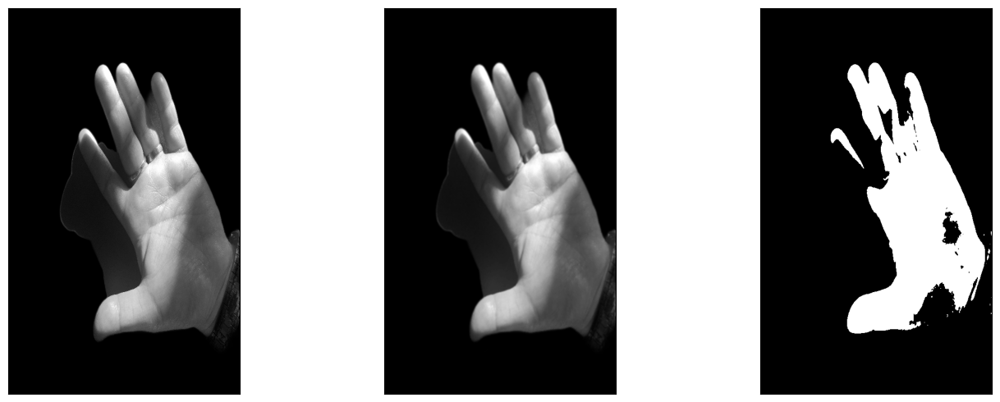

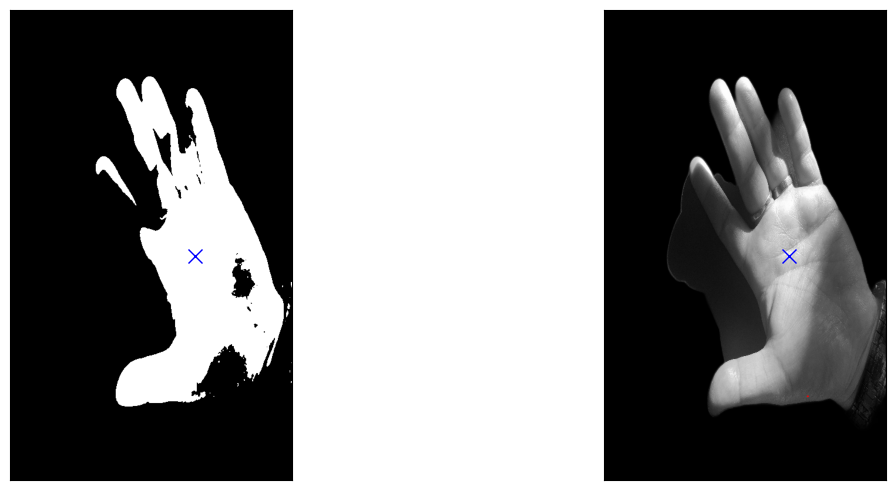

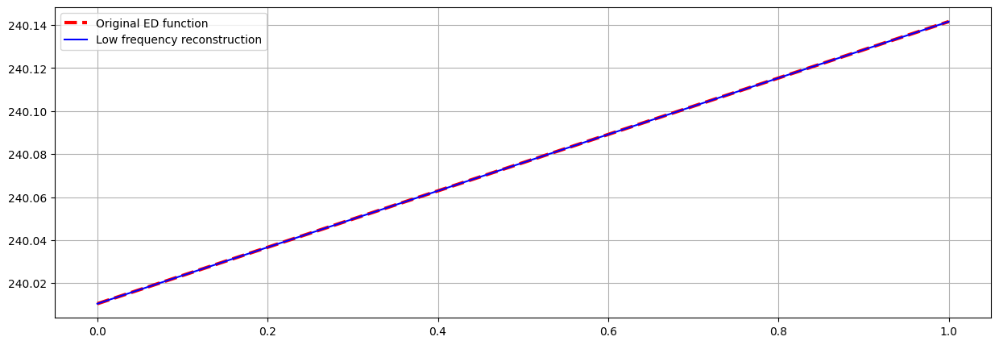

Power Retained: 100.0000%


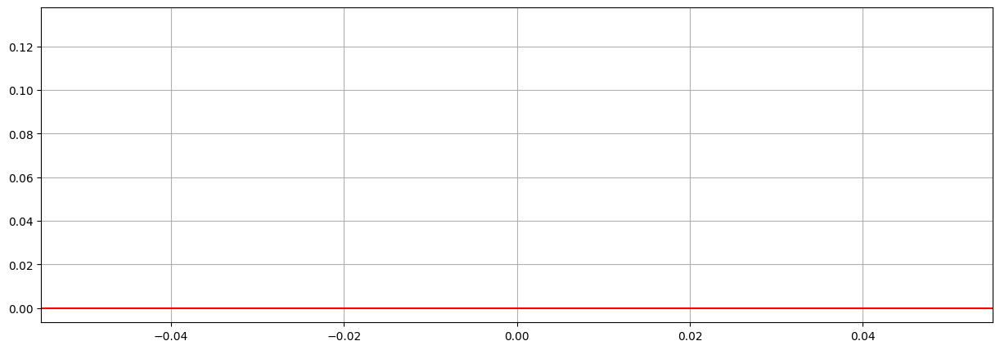

Error processing image Tangan Kiri 6-10\006\006_F_L_30.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_F_L_31.JPG


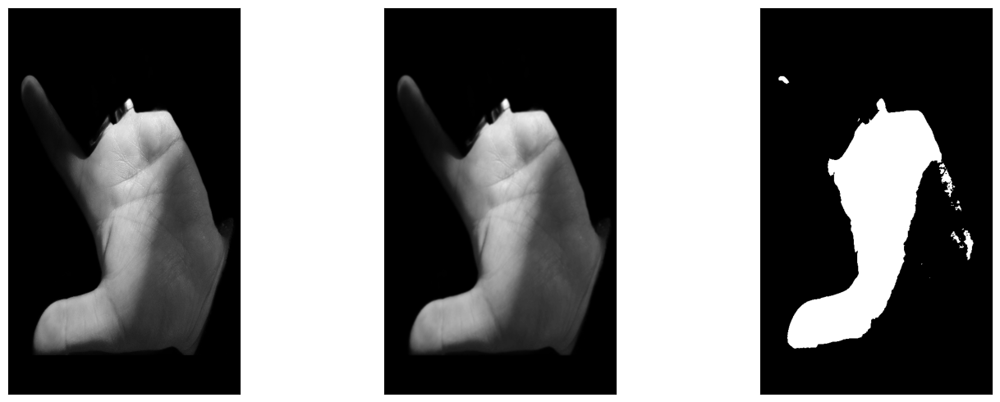

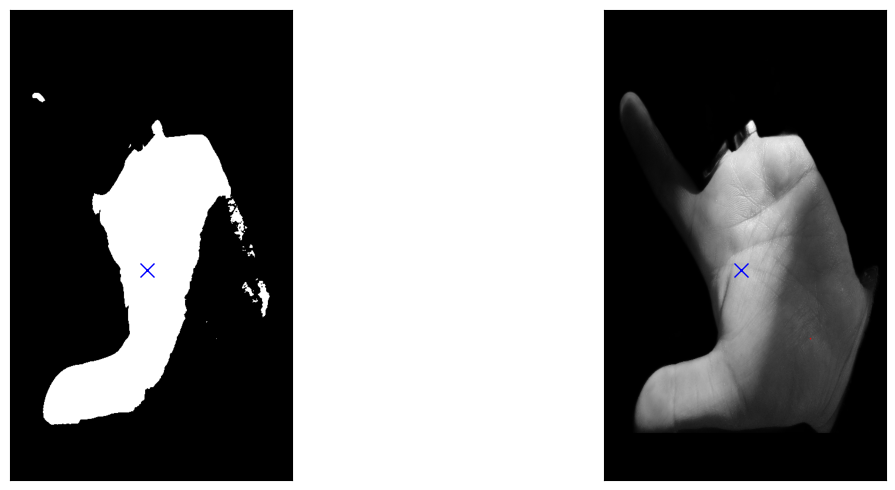

Error processing image Tangan Kiri 6-10\006\006_F_L_31.JPG: Invalid number of FFT data points (0) specified.
Processing image: Tangan Kiri 6-10\006\006_F_L_32.JPG


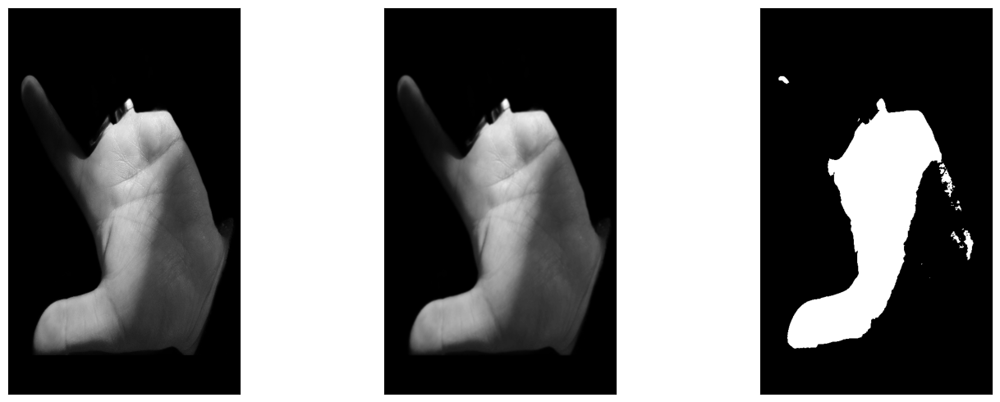

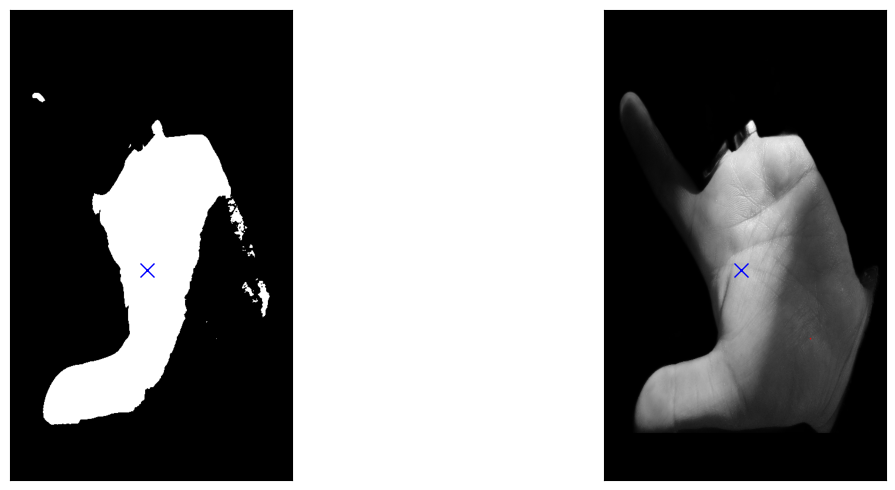

Error processing image Tangan Kiri 6-10\006\006_F_L_32.JPG: Invalid number of FFT data points (0) specified.
Processing image: Tangan Kiri 6-10\006\006_F_L_33.JPG


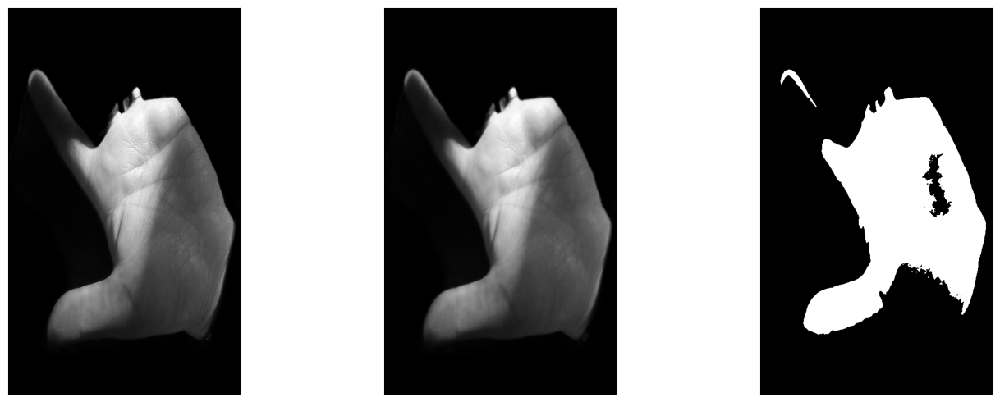

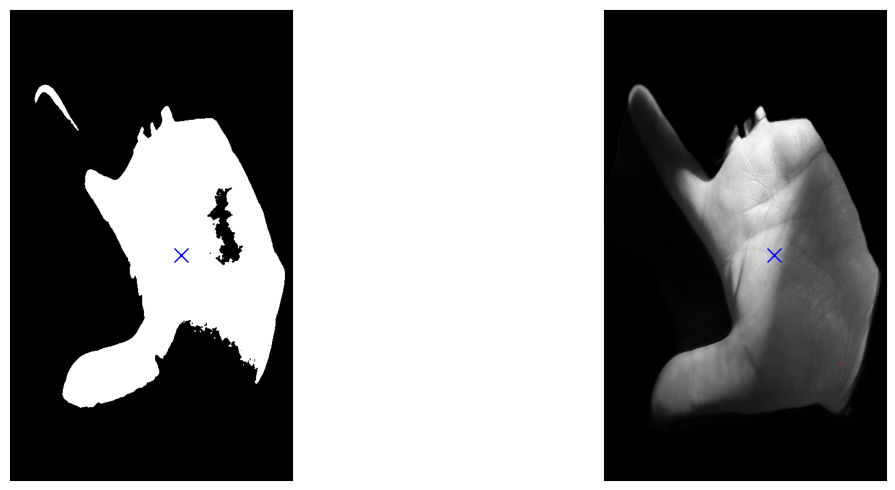

Error processing image Tangan Kiri 6-10\006\006_F_L_33.JPG: Invalid number of FFT data points (0) specified.
Processing image: Tangan Kiri 6-10\006\006_F_L_34.JPG


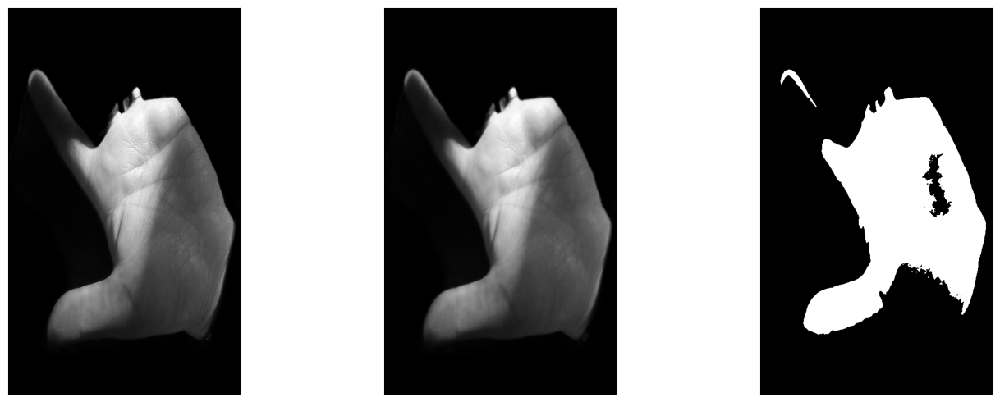

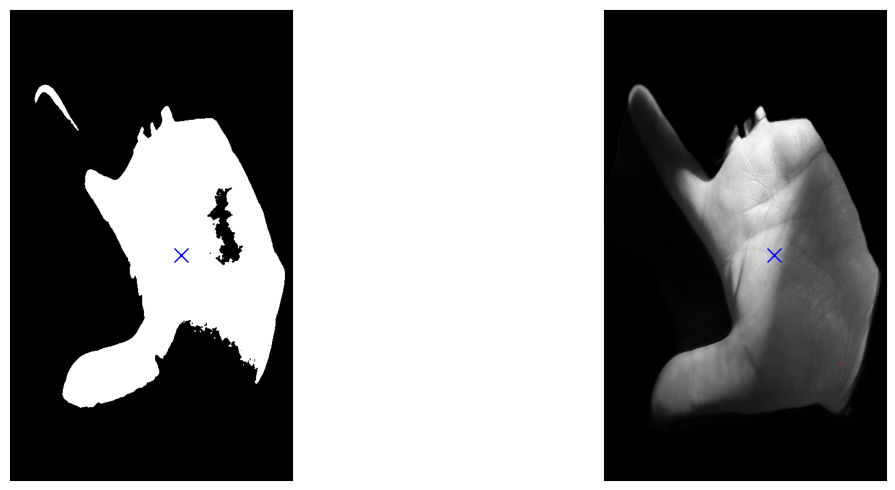

Error processing image Tangan Kiri 6-10\006\006_F_L_34.JPG: Invalid number of FFT data points (0) specified.
Processing image: Tangan Kiri 6-10\006\006_F_L_35.JPG


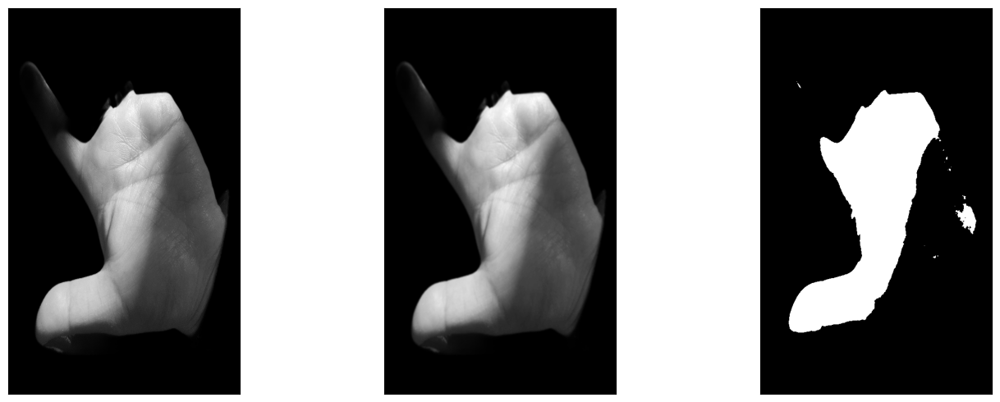

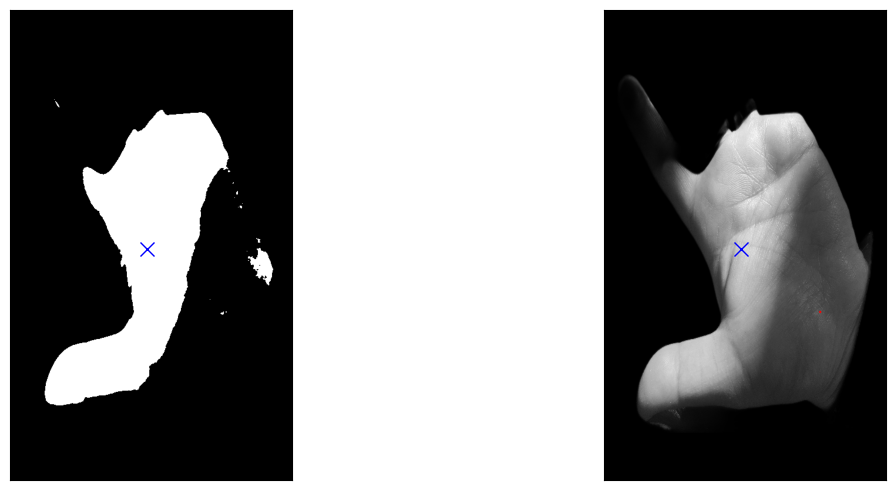

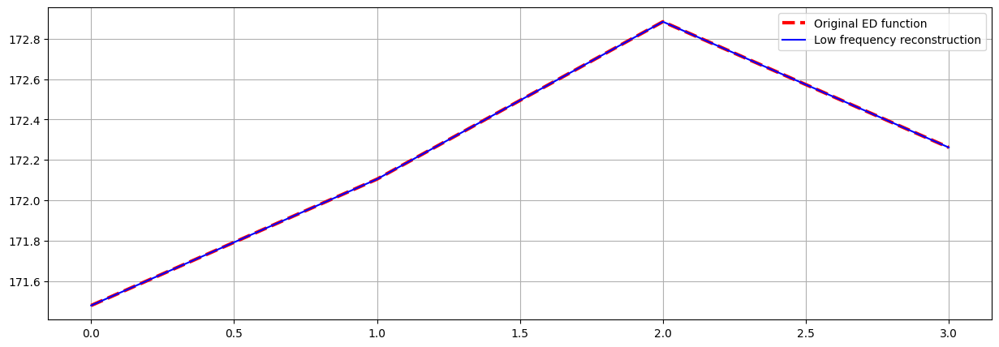

Power Retained: 100.0000%


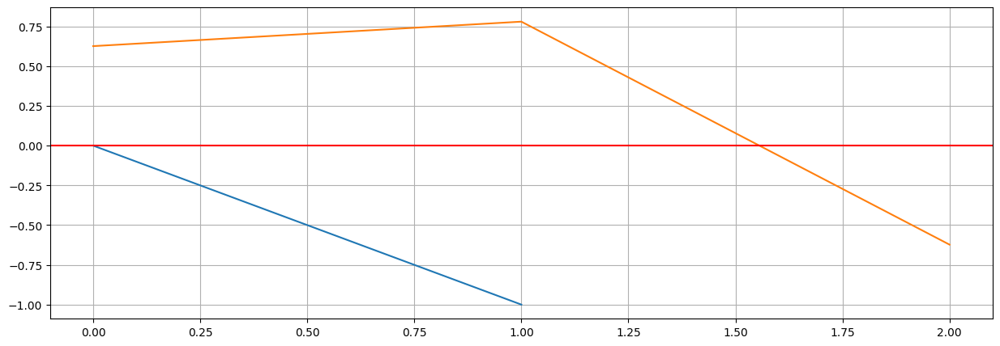

Error processing image Tangan Kiri 6-10\006\006_F_L_35.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_F_L_36.JPG


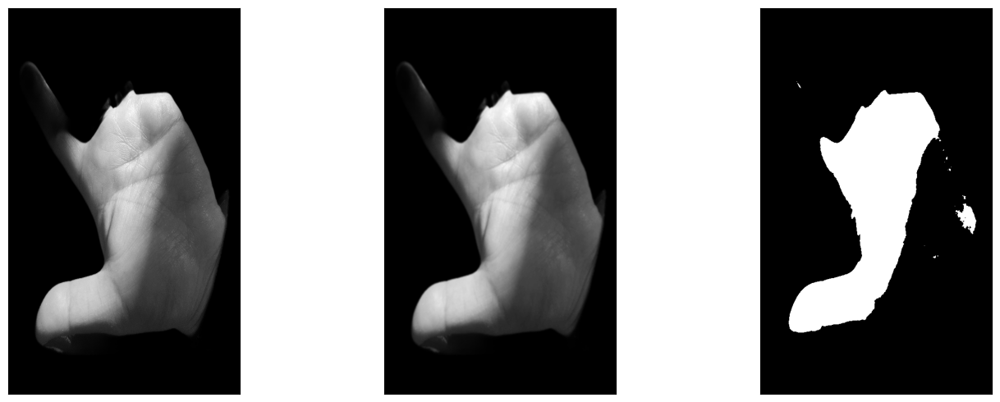

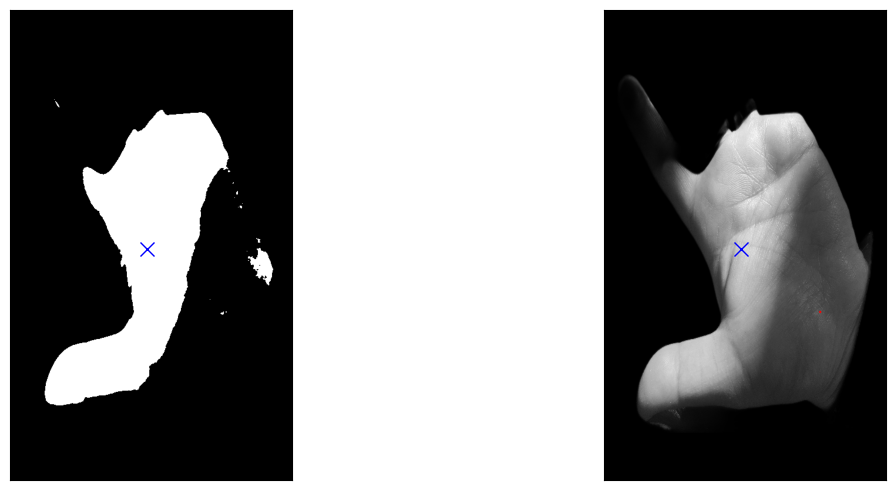

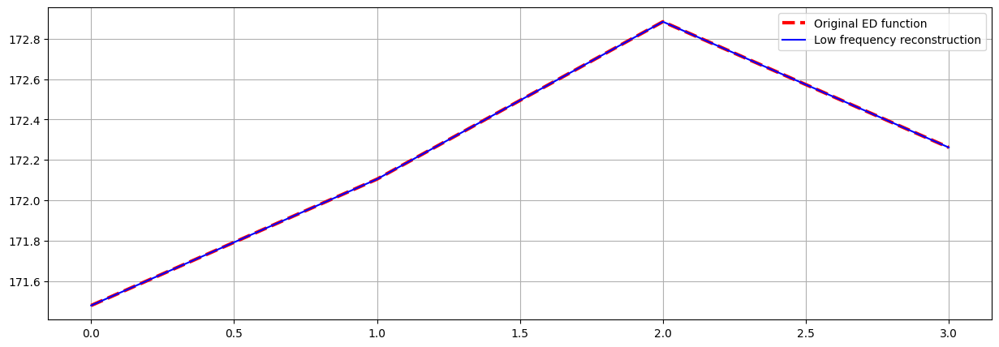

Power Retained: 100.0000%


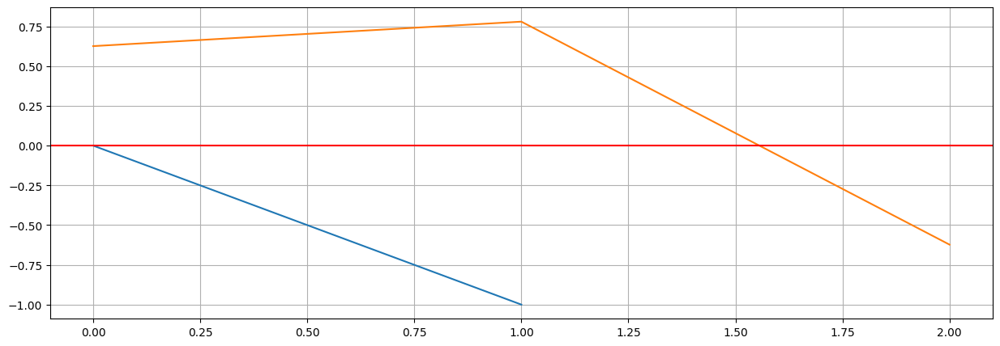

Error processing image Tangan Kiri 6-10\006\006_F_L_36.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_F_L_37.JPG


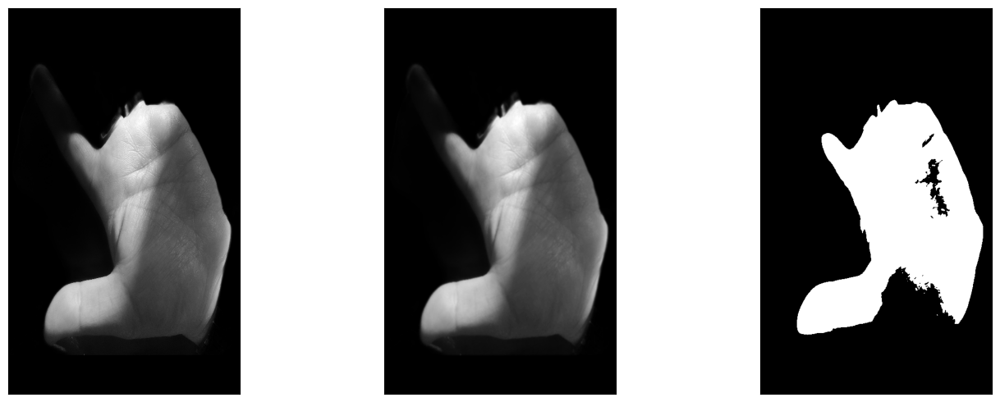

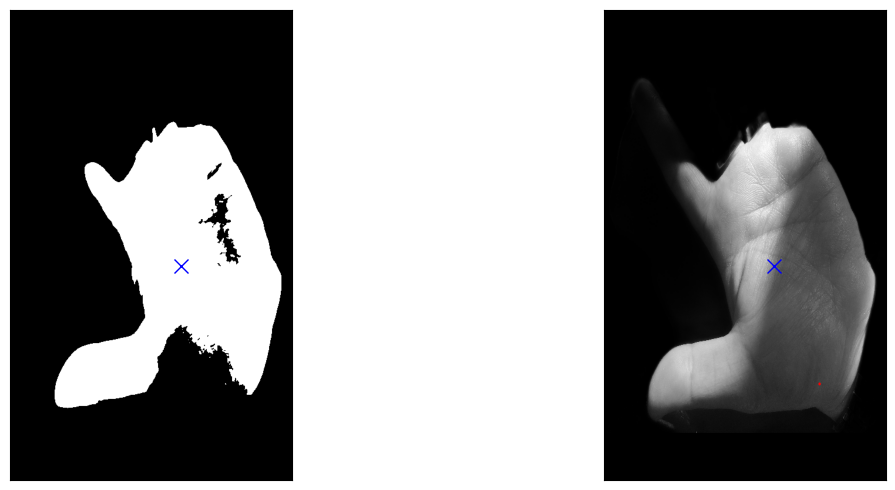

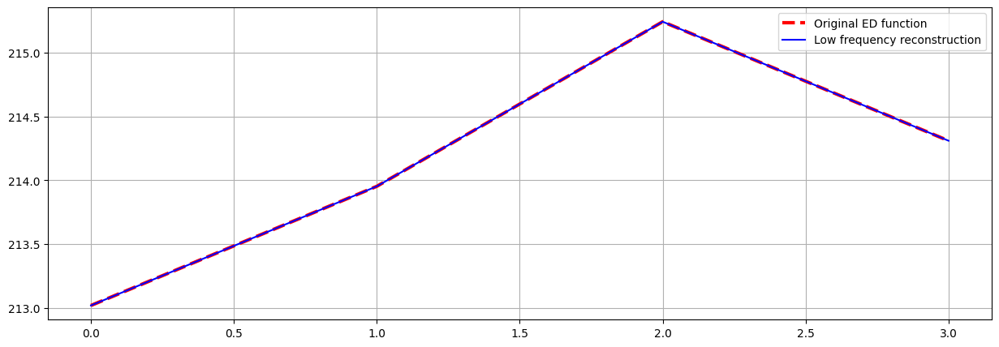

Power Retained: 100.0000%


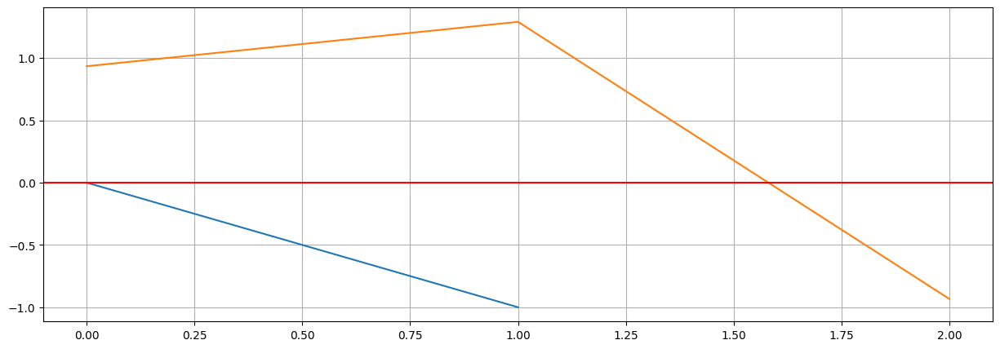

Error processing image Tangan Kiri 6-10\006\006_F_L_37.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_F_L_38.JPG


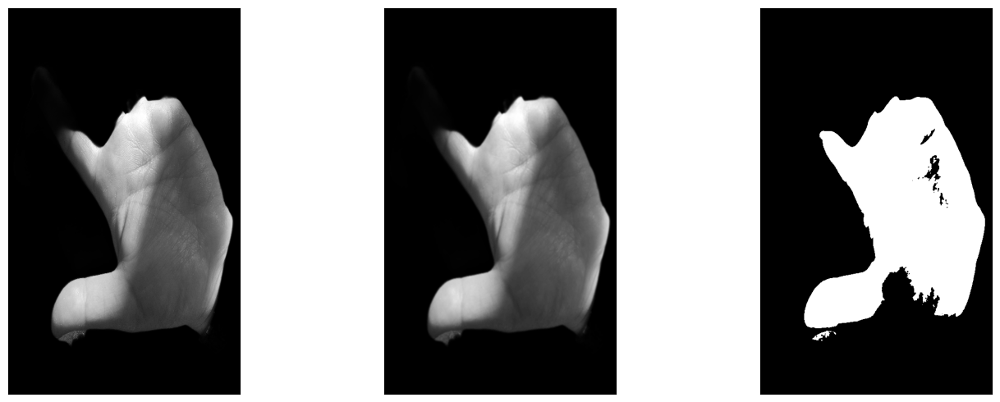

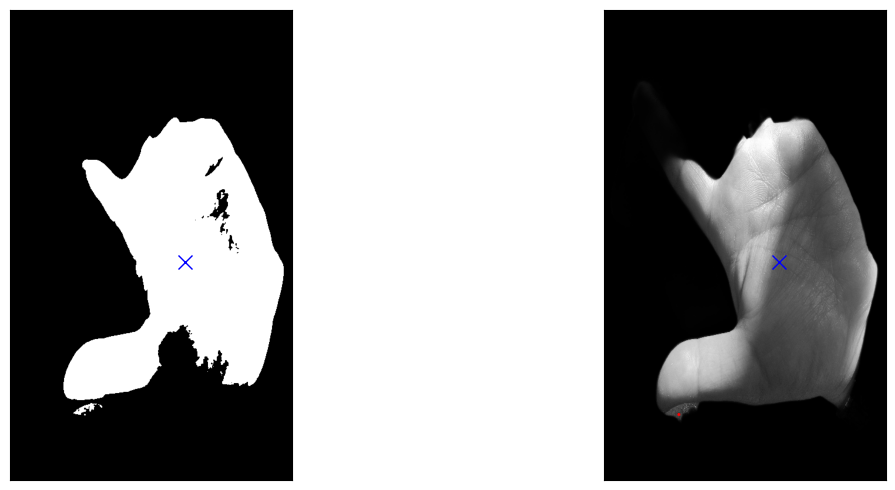

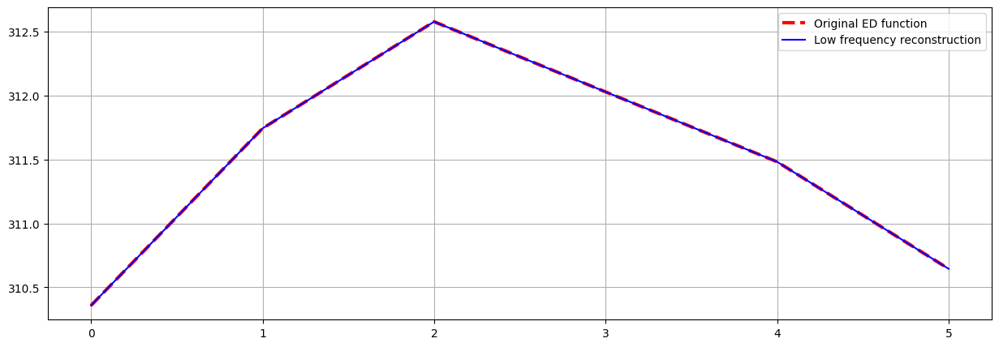

Power Retained: 100.0000%


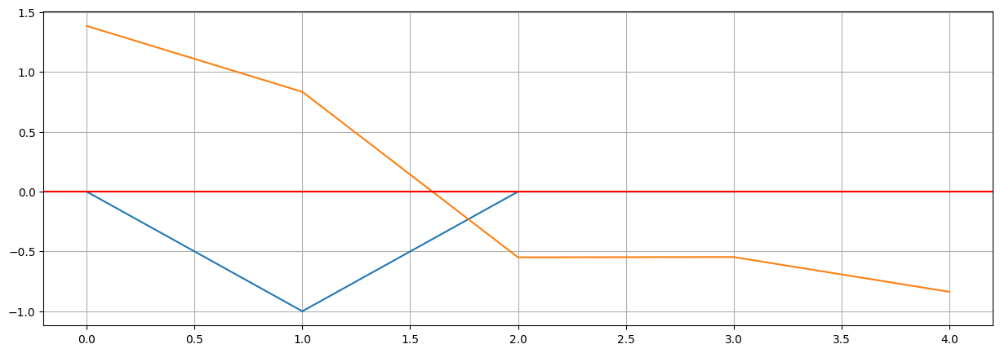

Error processing image Tangan Kiri 6-10\006\006_F_L_38.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_F_L_39.JPG


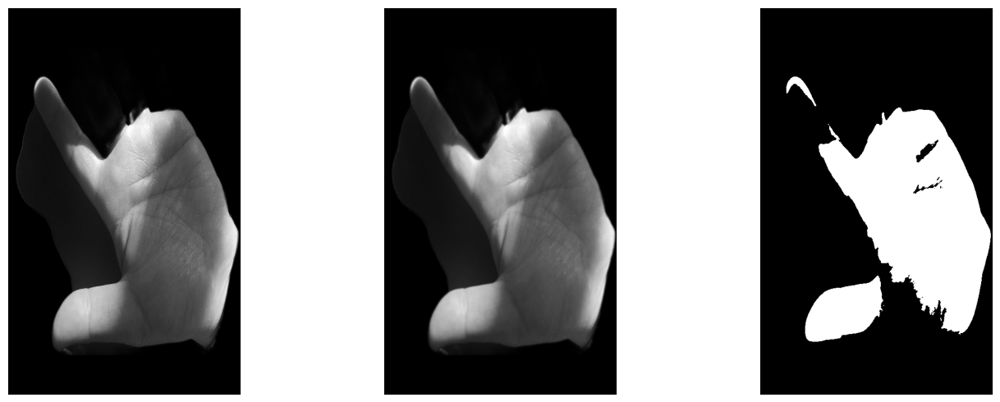

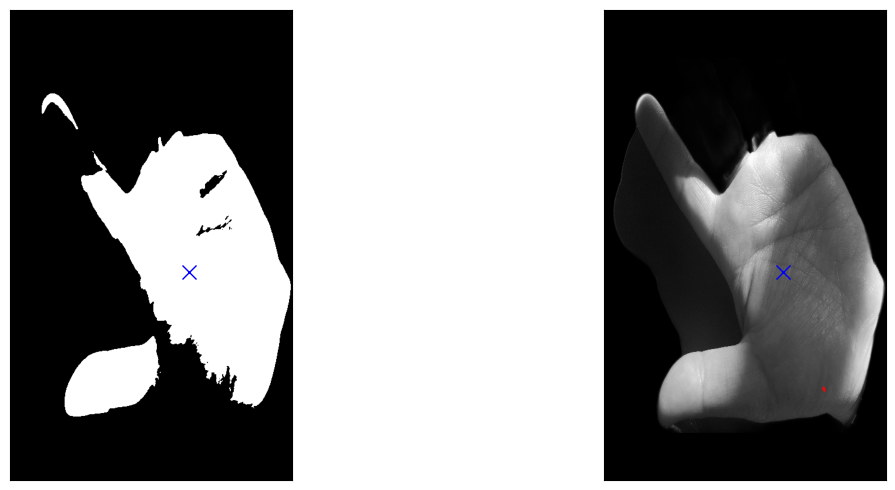

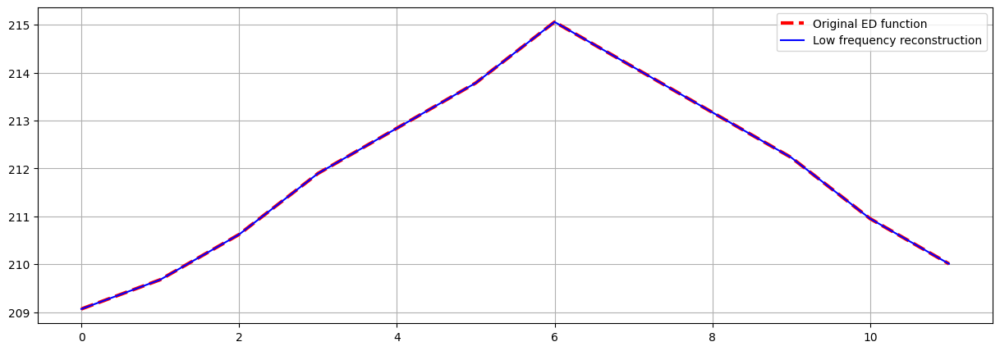

Power Retained: 100.0000%


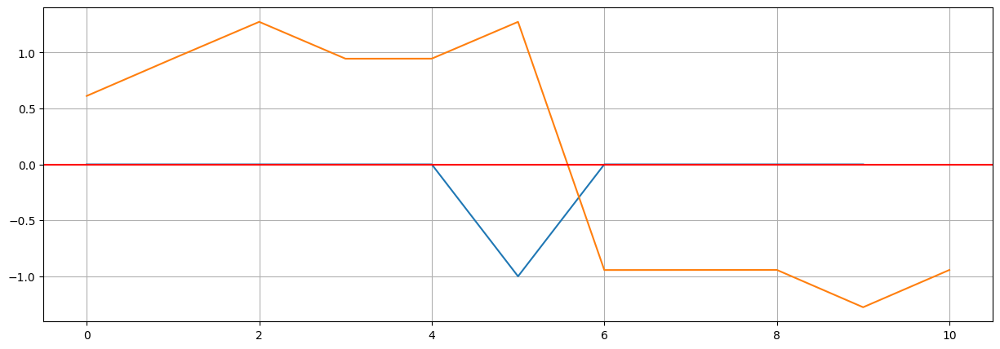

Error processing image Tangan Kiri 6-10\006\006_F_L_39.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_20.JPG


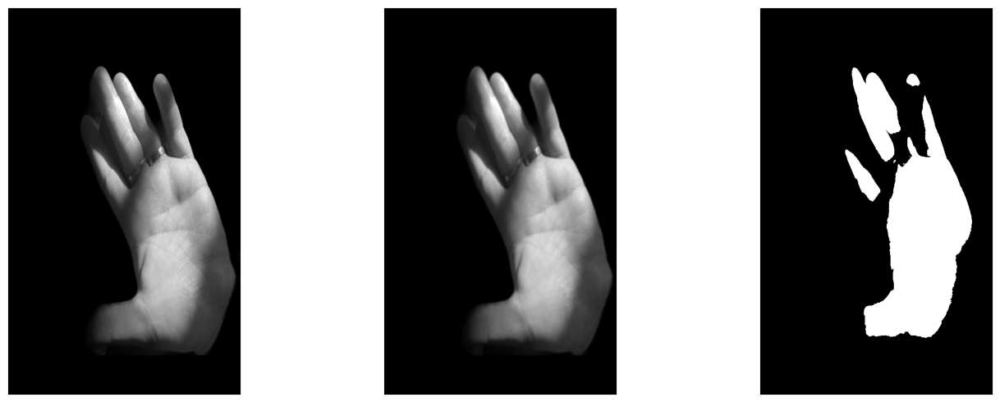

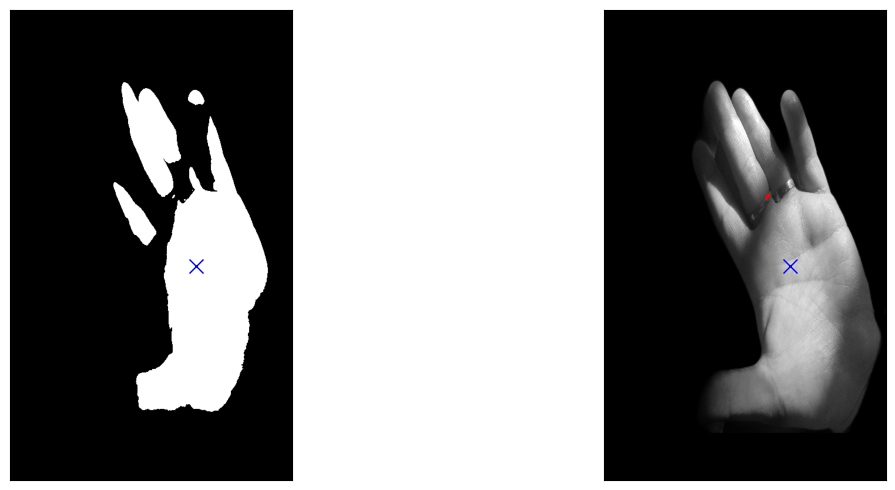

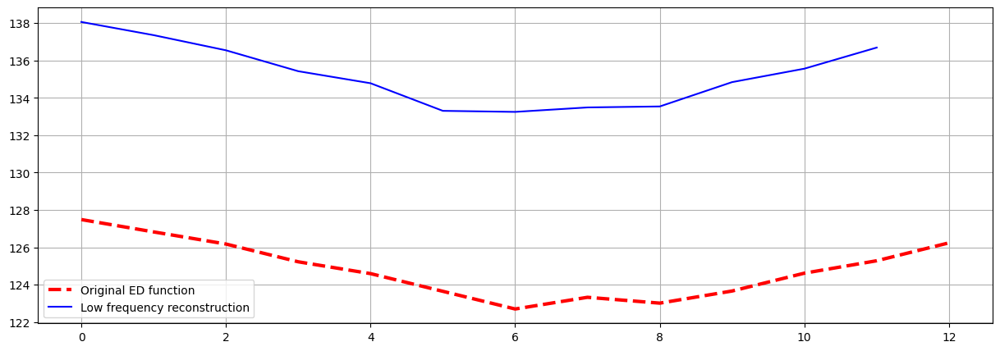

Power Retained: 100.0000%


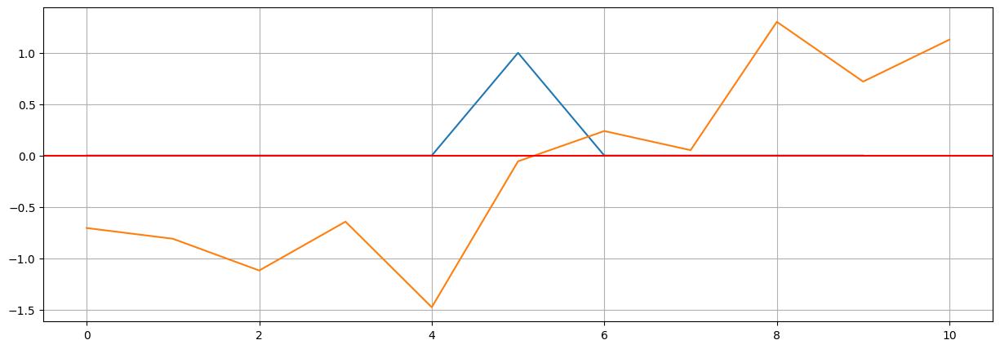

Error processing image Tangan Kiri 6-10\006\006_S_L_20.JPG: index -3 is out of bounds for axis 0 with size 1
Processing image: Tangan Kiri 6-10\006\006_S_L_21.JPG


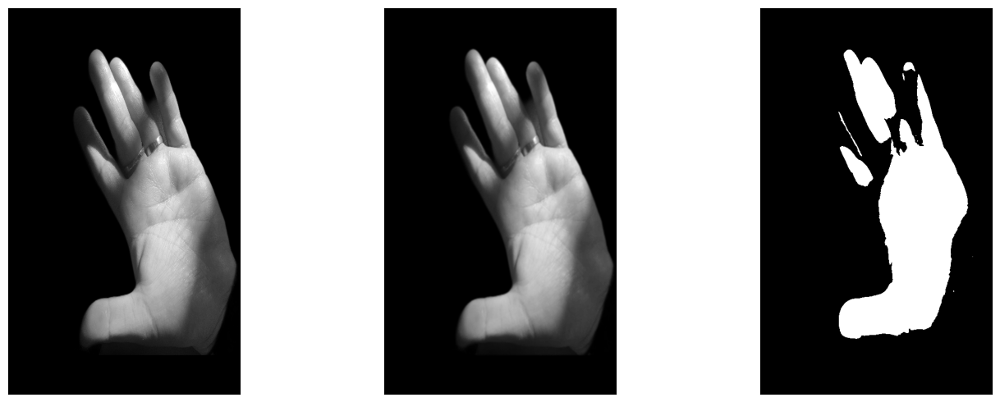

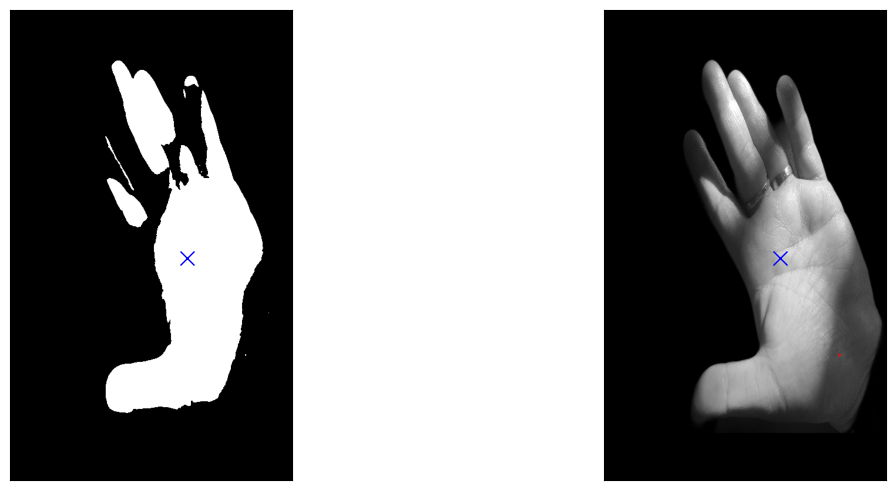

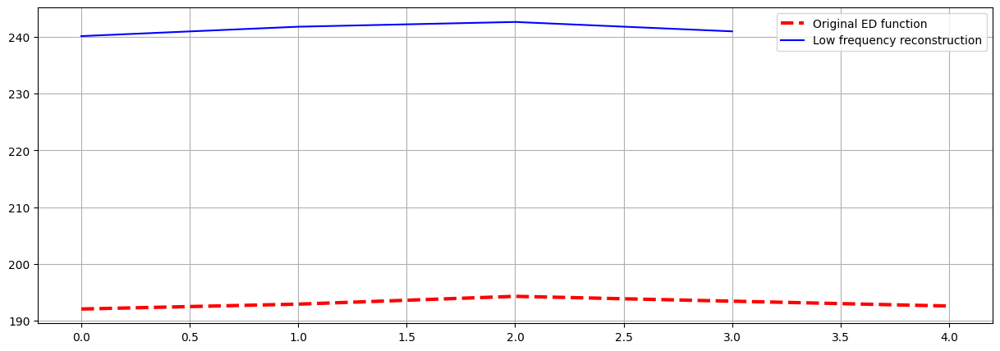

Power Retained: 100.0000%


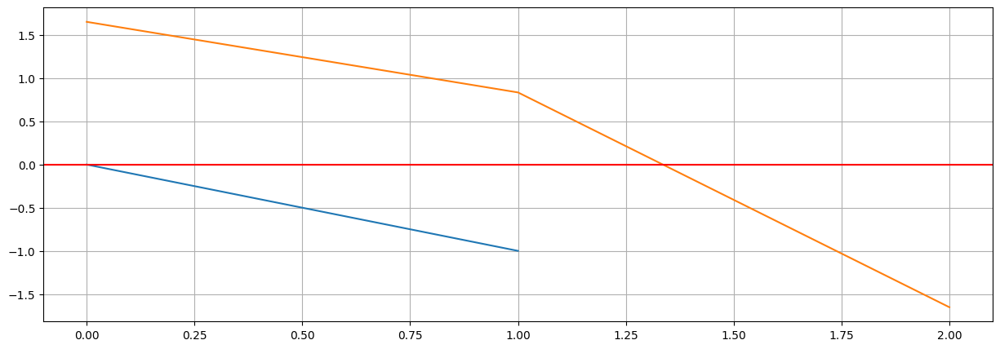

Error processing image Tangan Kiri 6-10\006\006_S_L_21.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_22.JPG


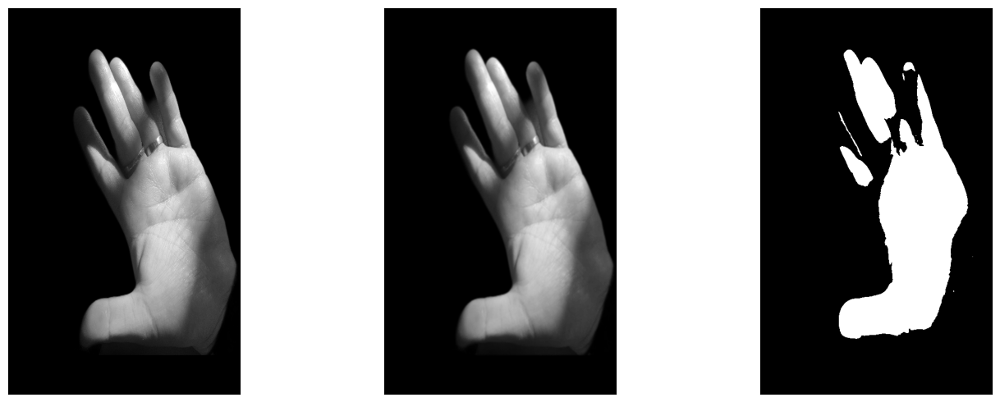

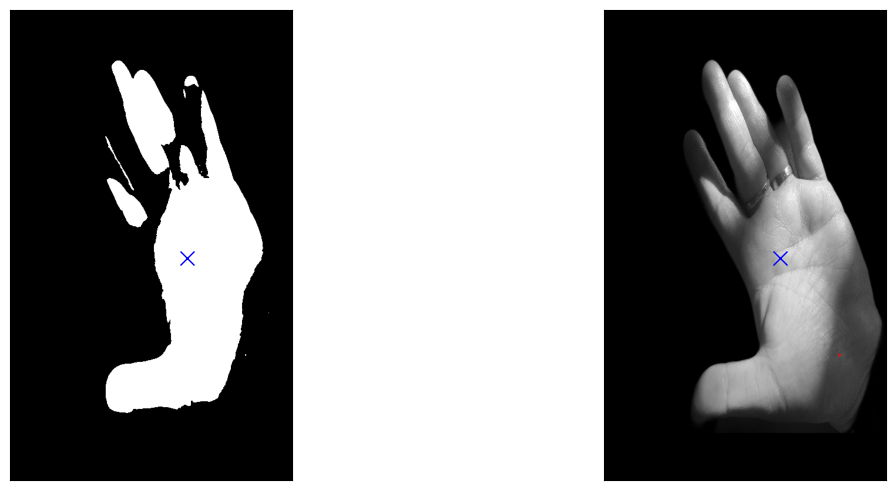

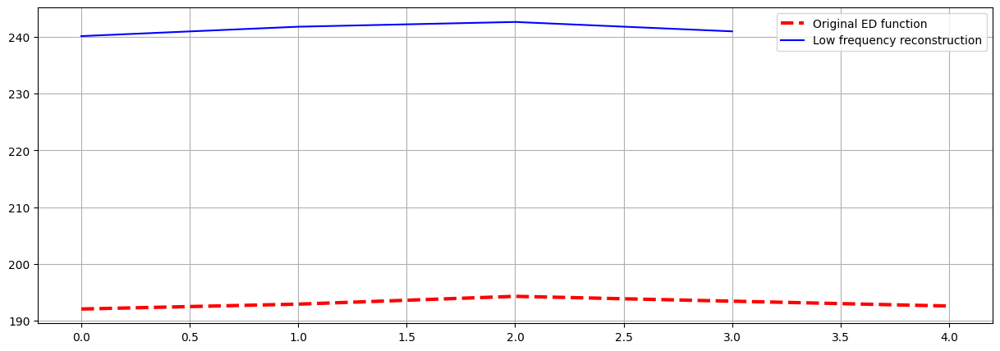

Power Retained: 100.0000%


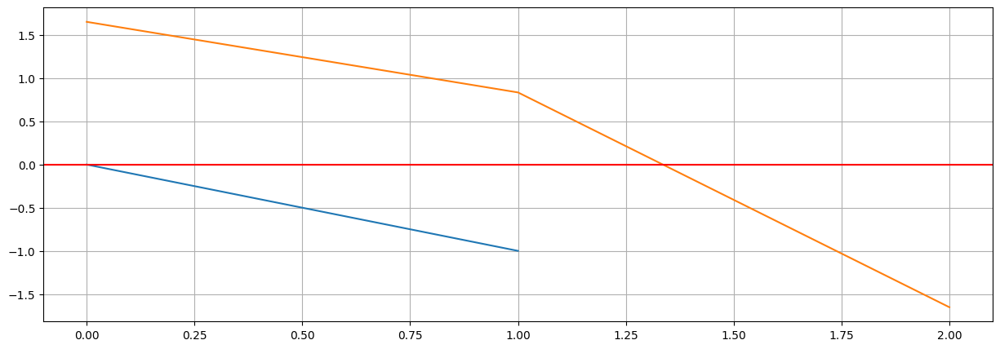

Error processing image Tangan Kiri 6-10\006\006_S_L_22.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_23.JPG


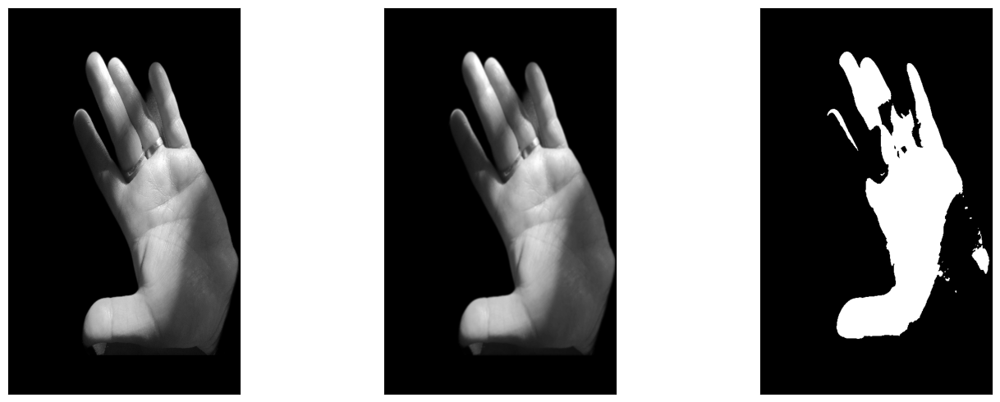

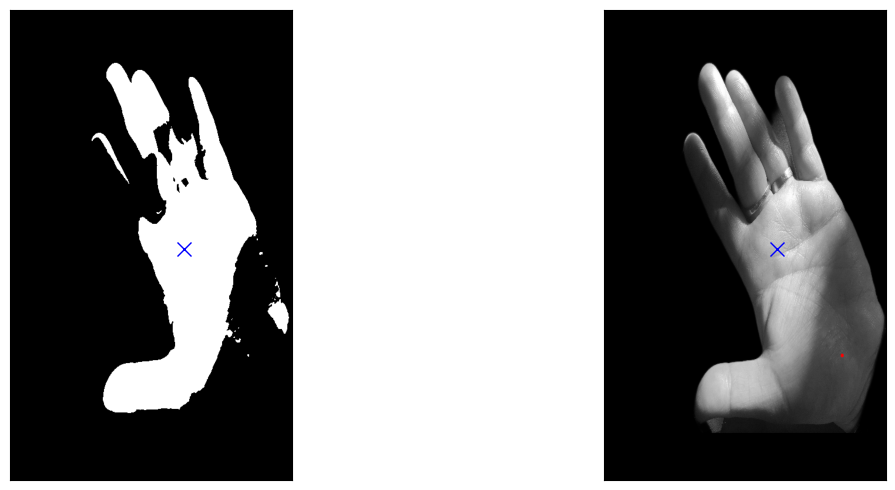

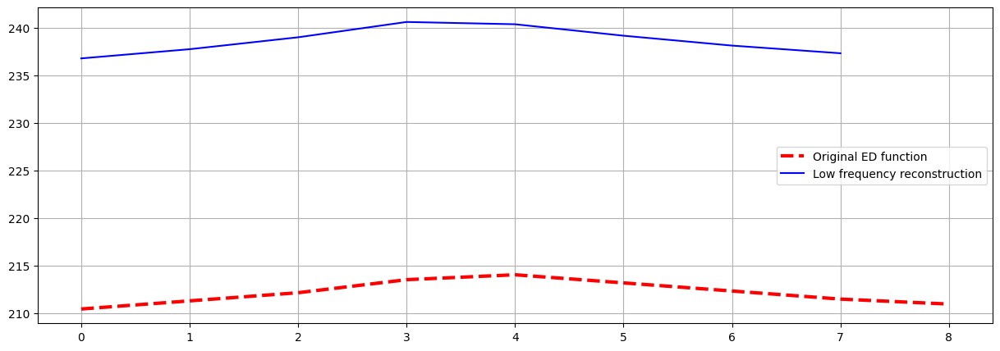

Power Retained: 100.0000%


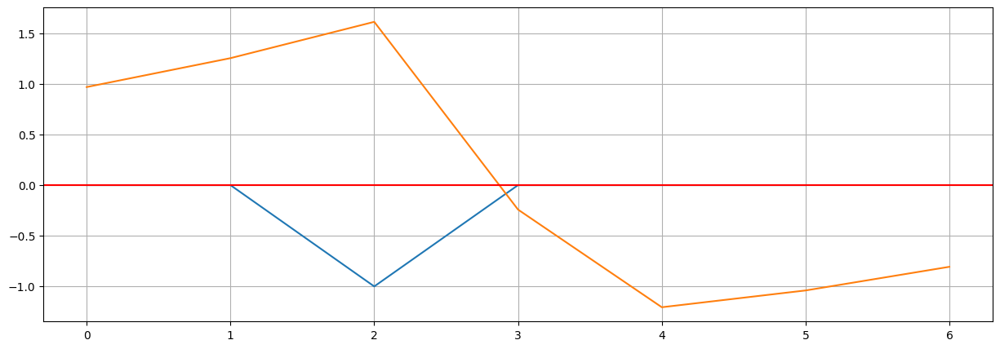

Error processing image Tangan Kiri 6-10\006\006_S_L_23.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_24.JPG


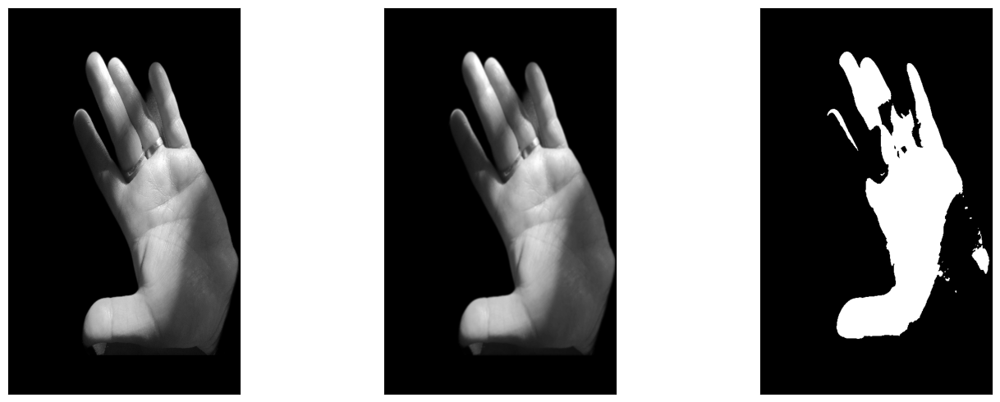

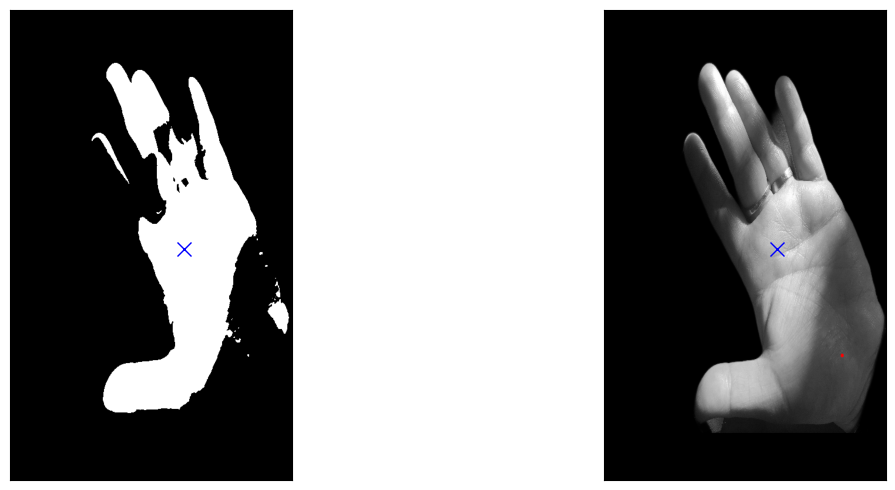

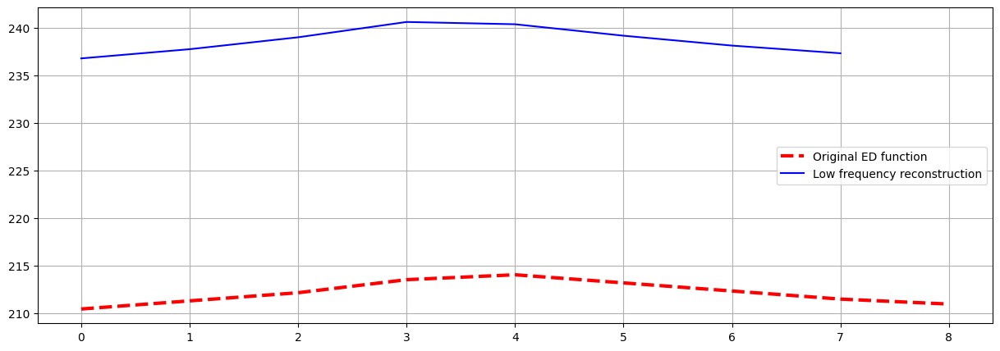

Power Retained: 100.0000%


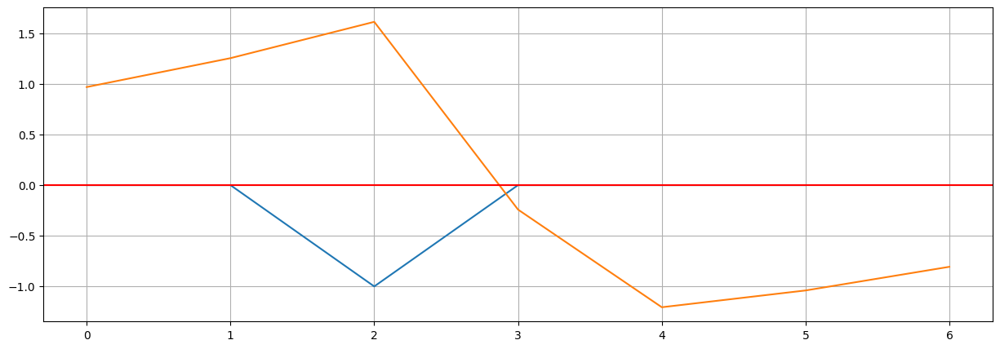

Error processing image Tangan Kiri 6-10\006\006_S_L_24.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_25.JPG


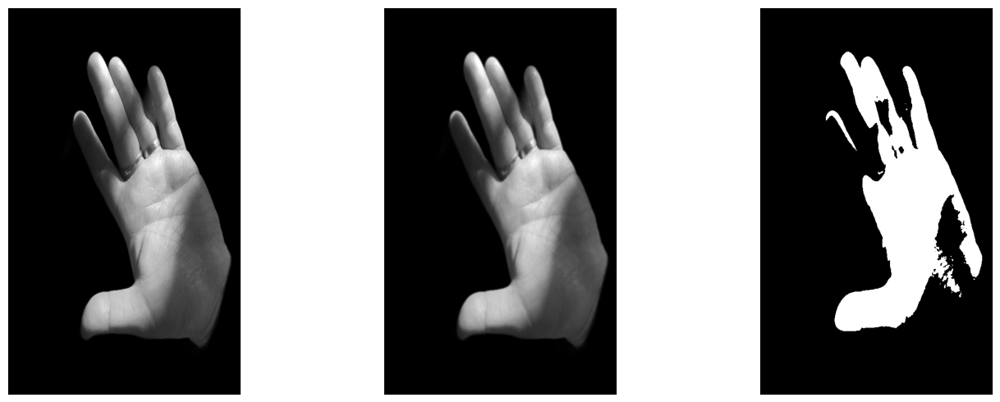

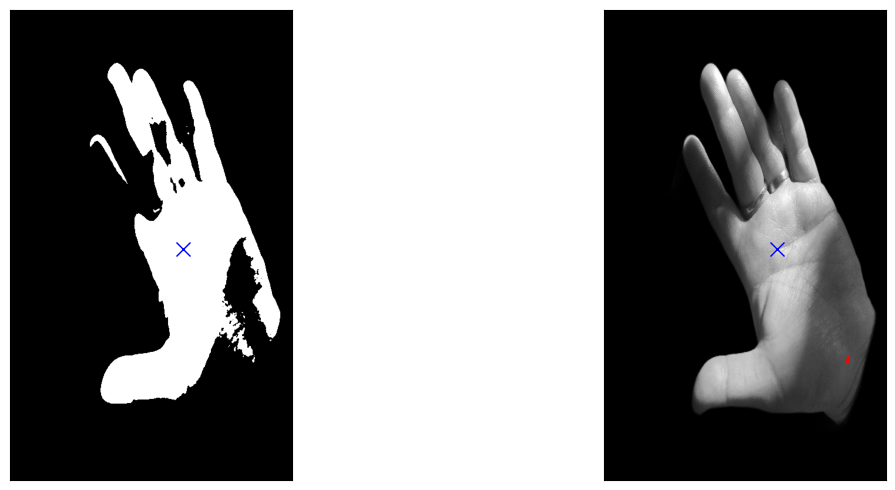

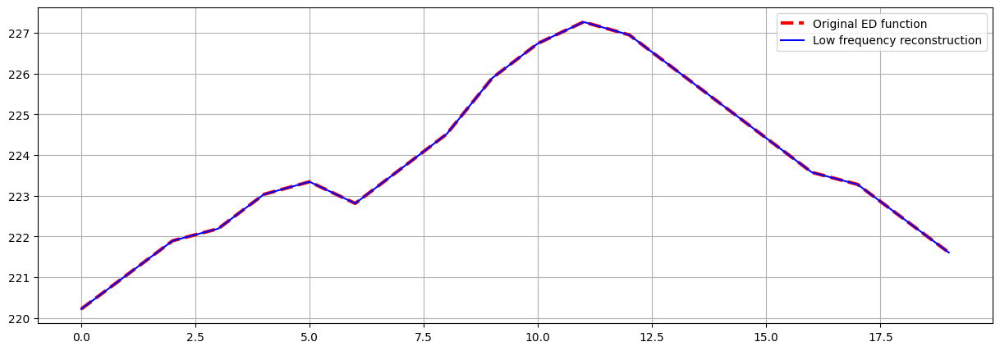

Power Retained: 100.0000%


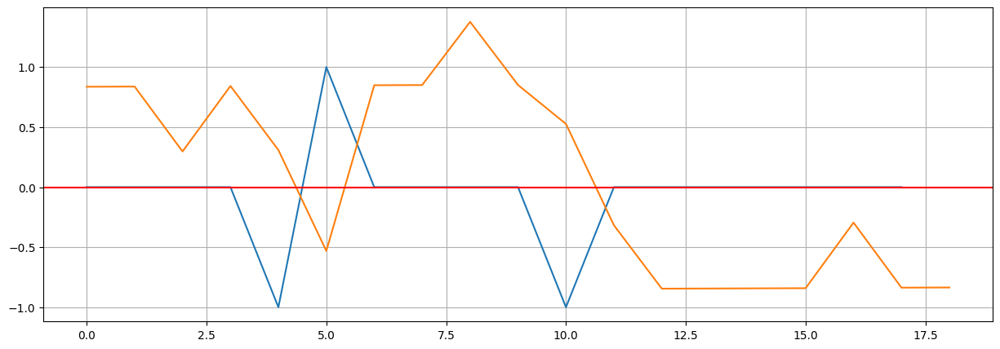

Error processing image Tangan Kiri 6-10\006\006_S_L_25.JPG: index -3 is out of bounds for axis 0 with size 1
Processing image: Tangan Kiri 6-10\006\006_S_L_26.JPG


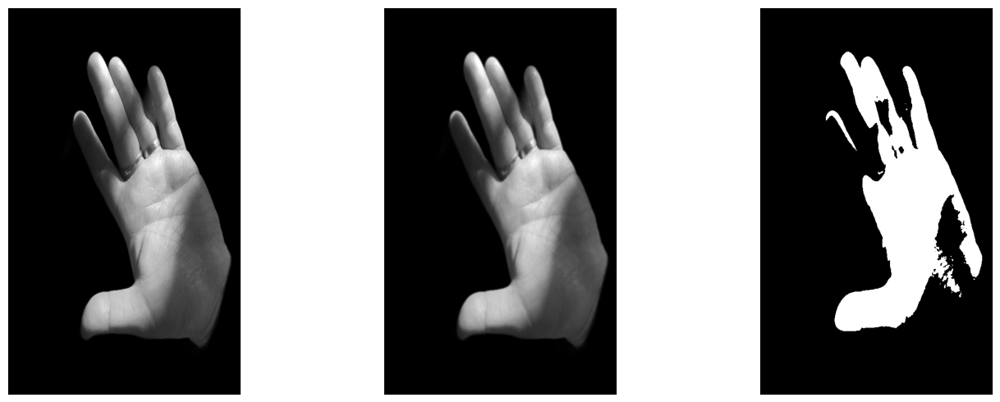

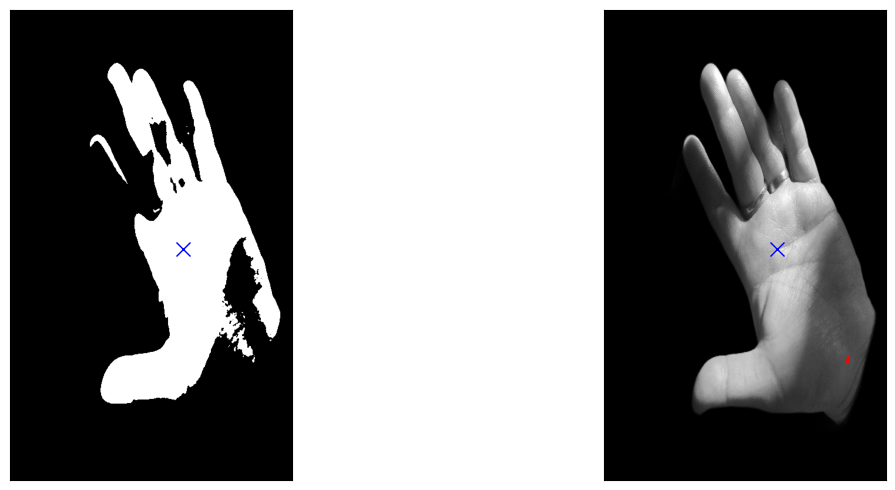

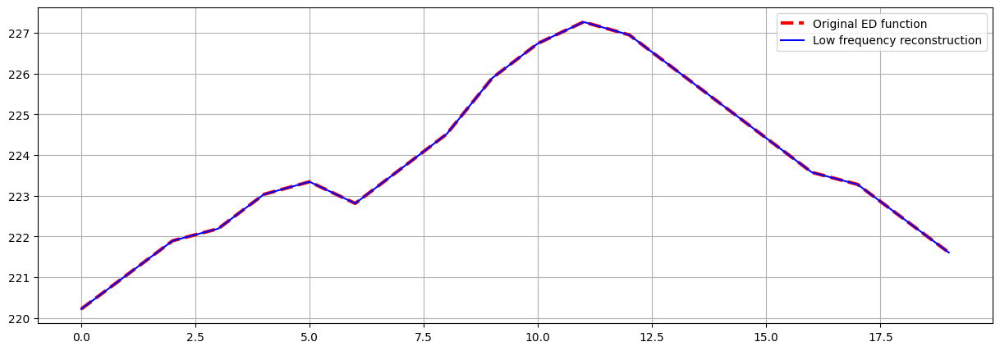

Power Retained: 100.0000%


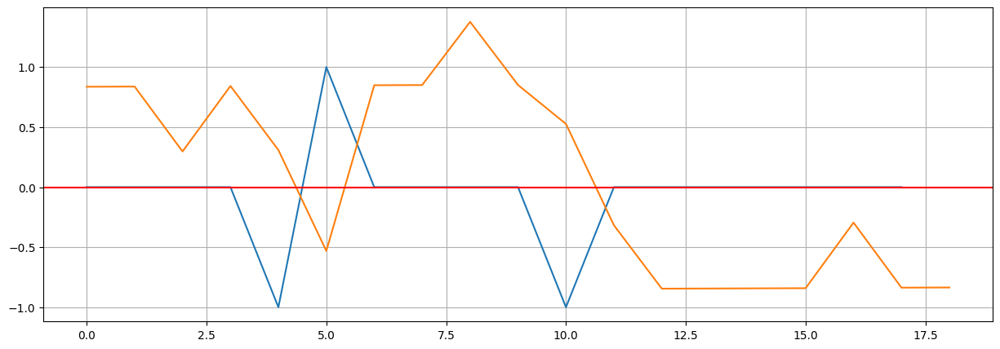

Error processing image Tangan Kiri 6-10\006\006_S_L_26.JPG: index -3 is out of bounds for axis 0 with size 1
Processing image: Tangan Kiri 6-10\006\006_S_L_27.JPG


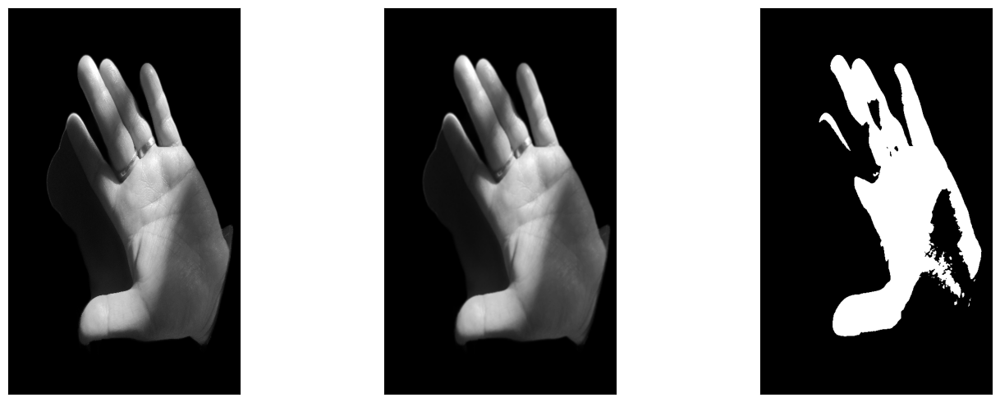

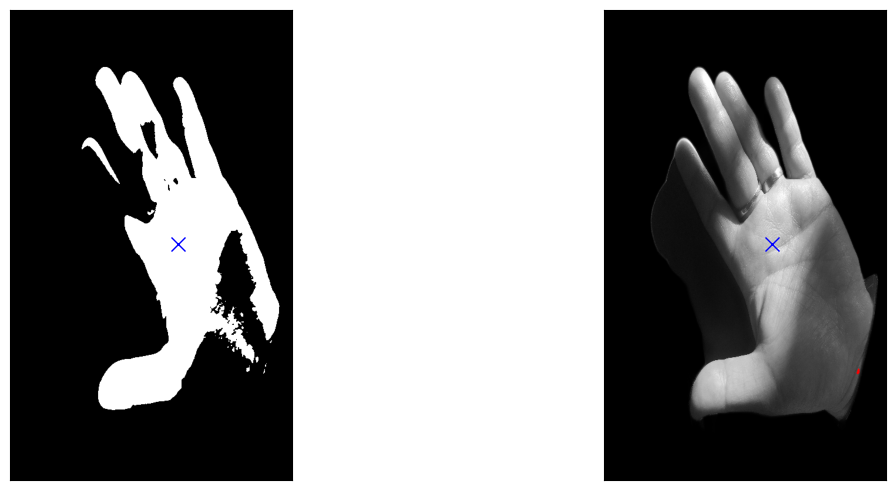

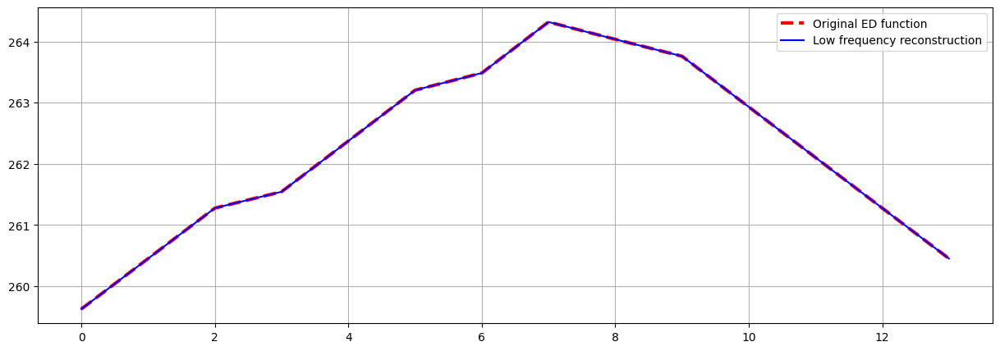

Power Retained: 100.0000%


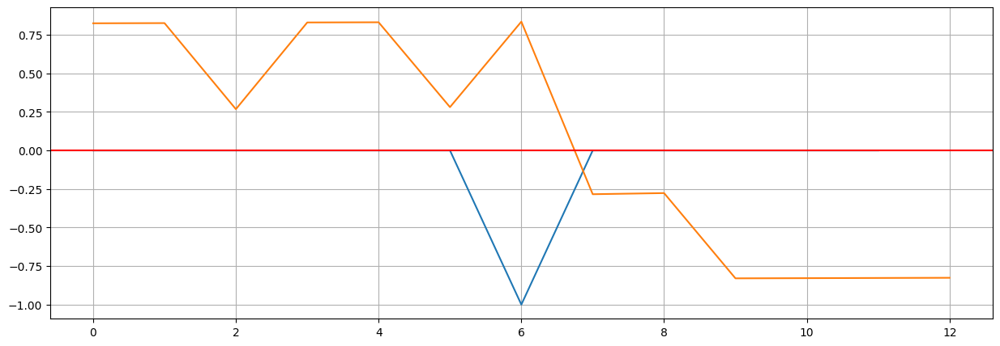

Error processing image Tangan Kiri 6-10\006\006_S_L_27.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_28.JPG


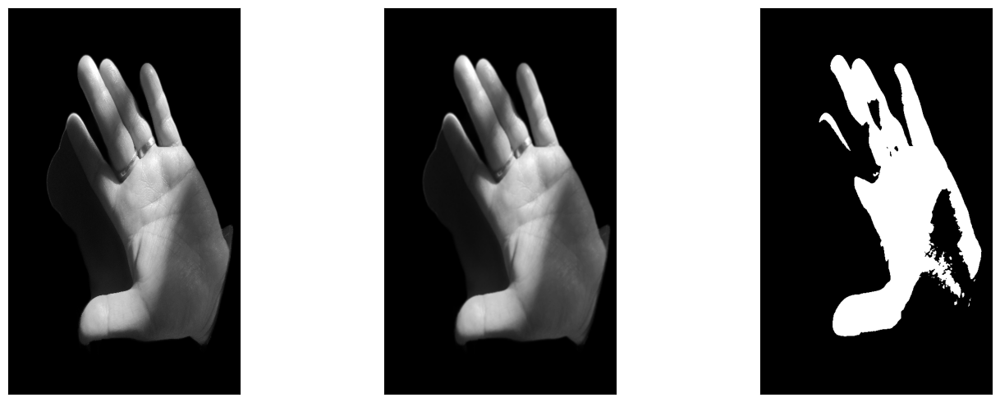

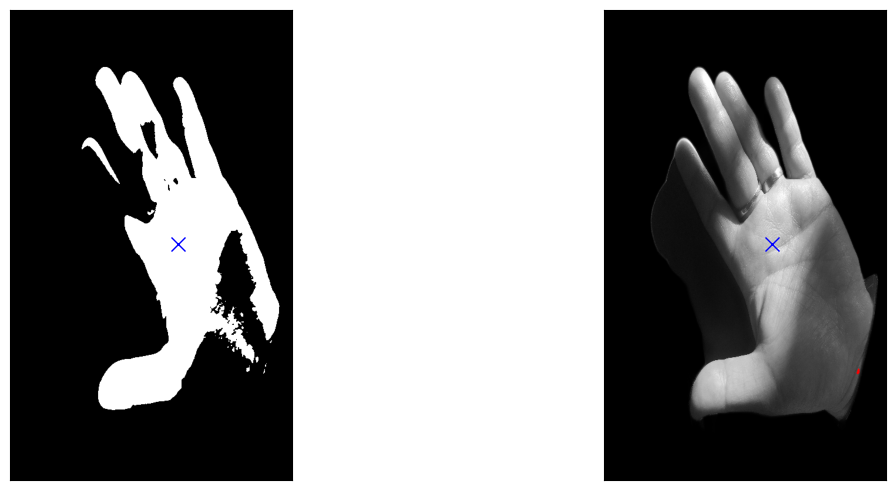

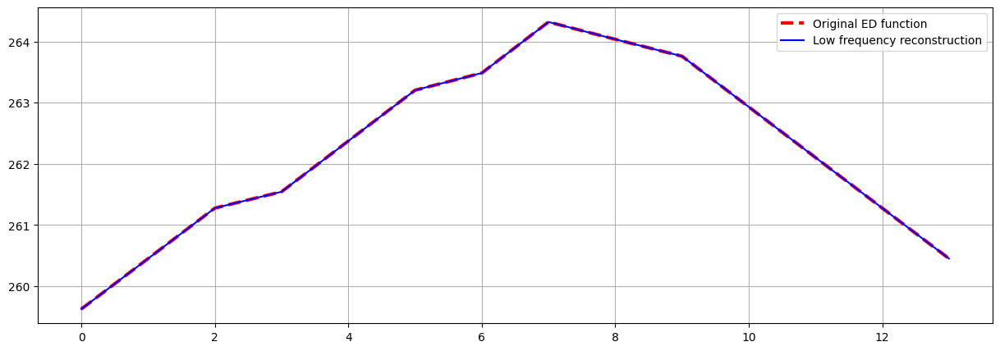

Power Retained: 100.0000%


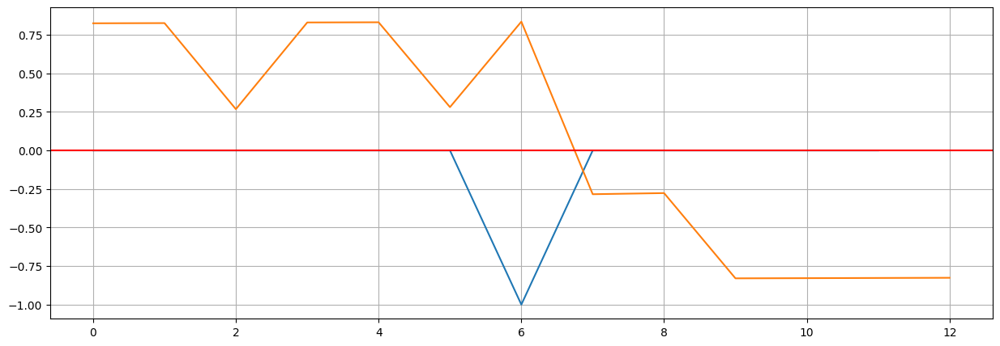

Error processing image Tangan Kiri 6-10\006\006_S_L_28.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\006\006_S_L_29.JPG


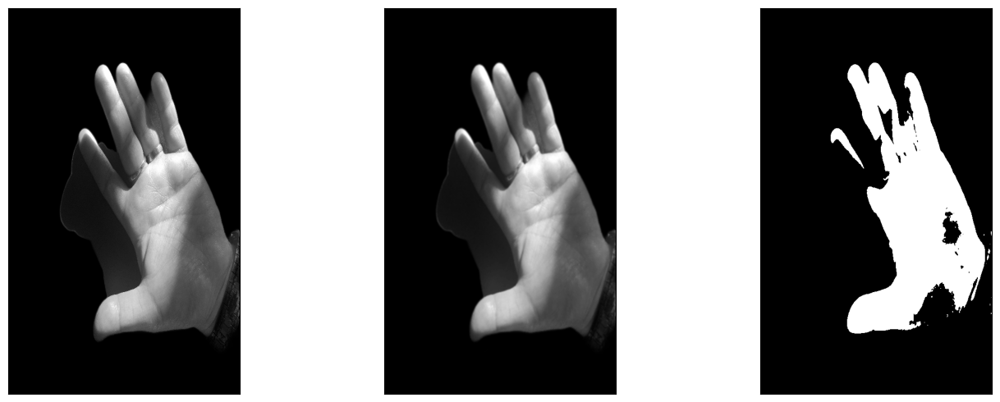

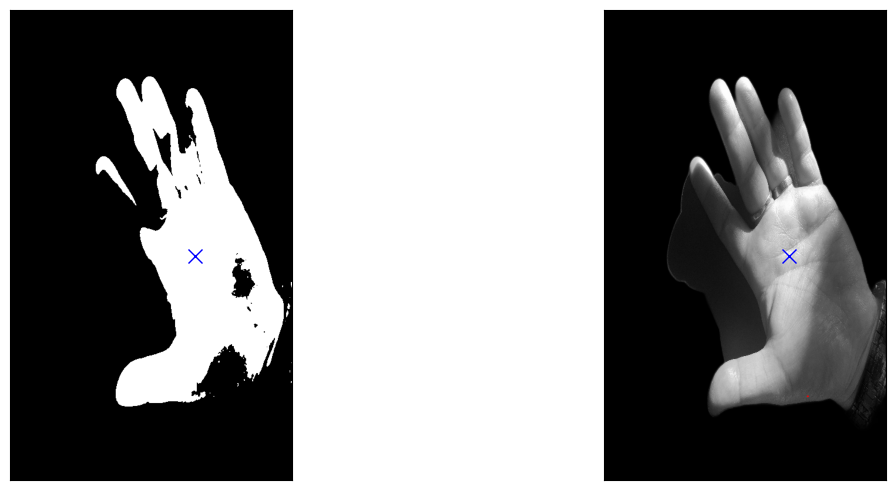

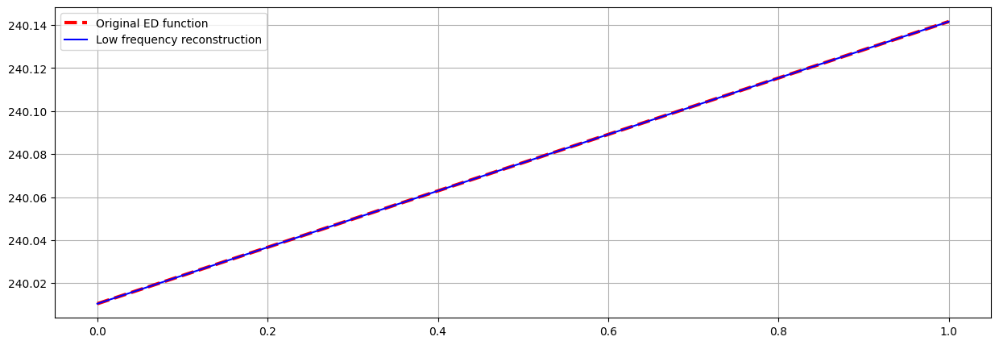

Power Retained: 100.0000%


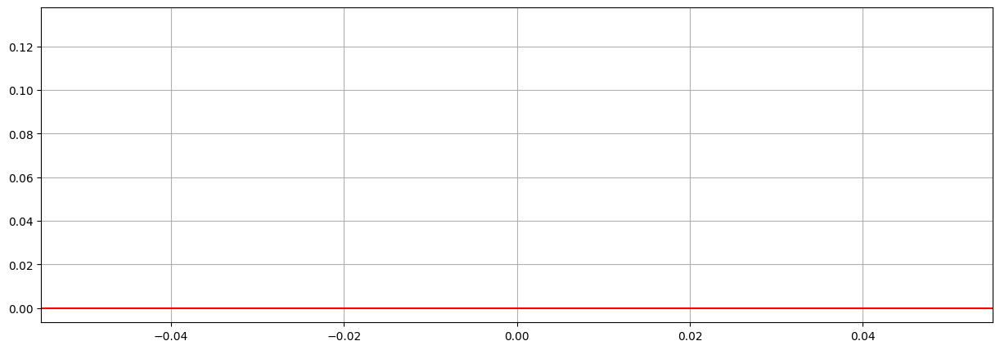

Error processing image Tangan Kiri 6-10\006\006_S_L_29.JPG: index -1 is out of bounds for axis 0 with size 0
Processing images in folder: Tangan Kiri 6-10\007
Processing image: Tangan Kiri 6-10\007\007_F_L_30.JPG


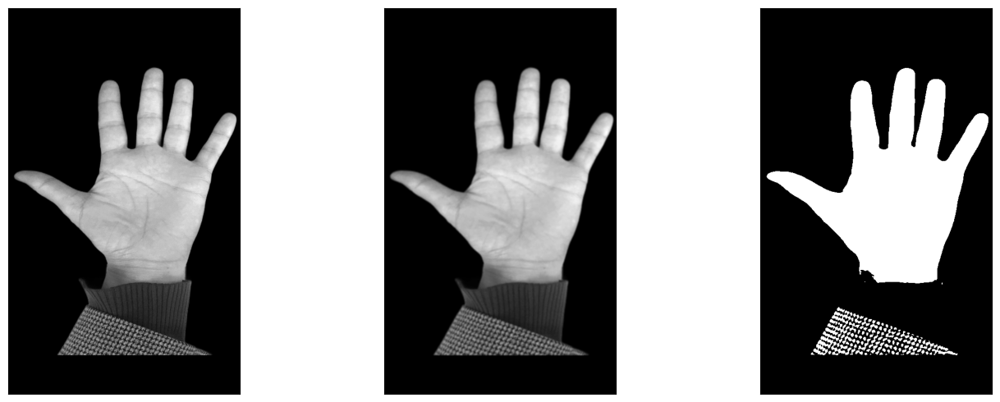

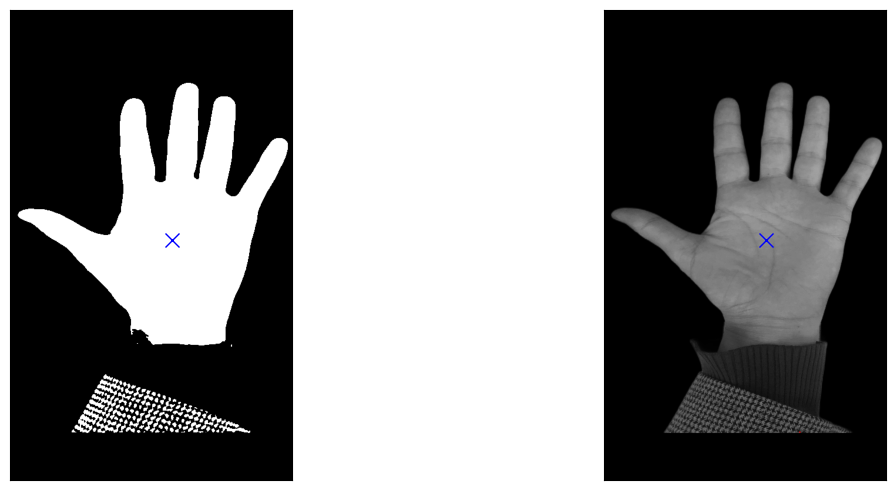

Error processing image Tangan Kiri 6-10\007\007_F_L_30.JPG: Invalid number of FFT data points (0) specified.
Processing image: Tangan Kiri 6-10\007\007_F_L_31.JPG


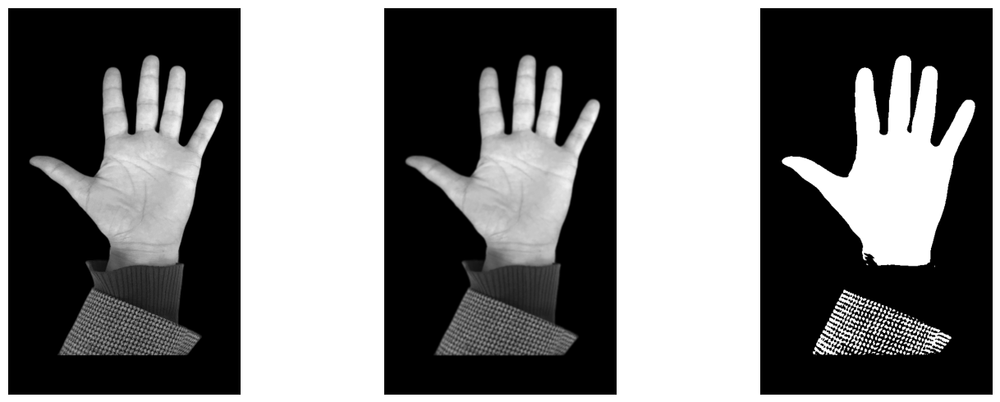

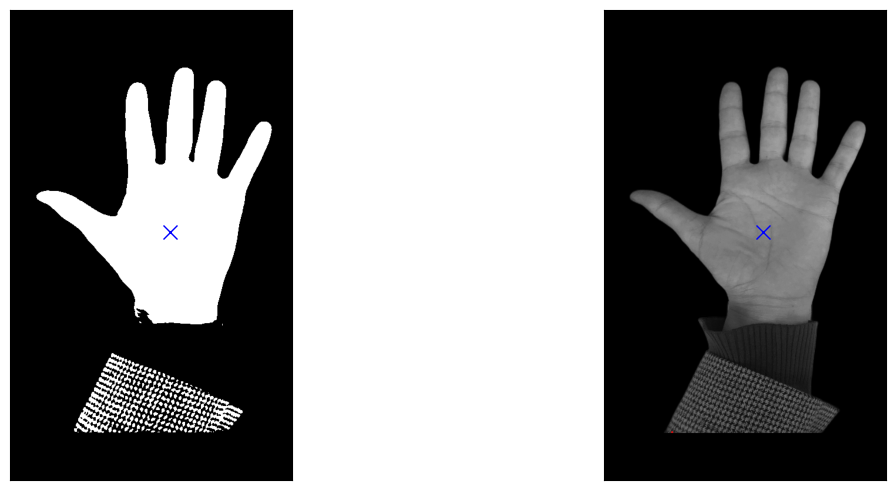

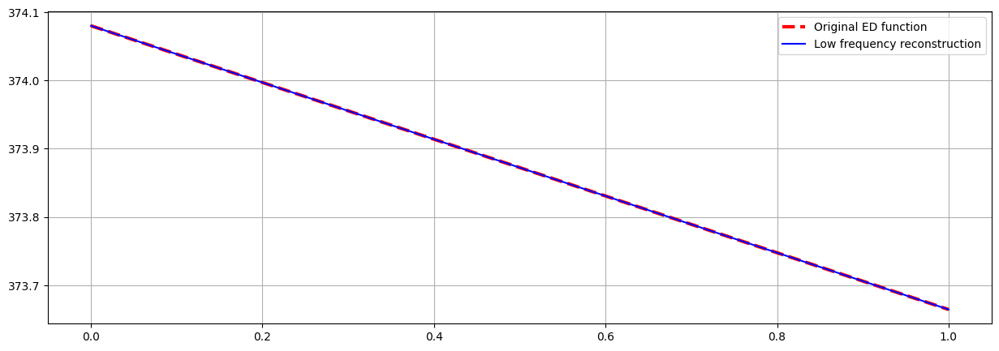

Power Retained: 100.0000%


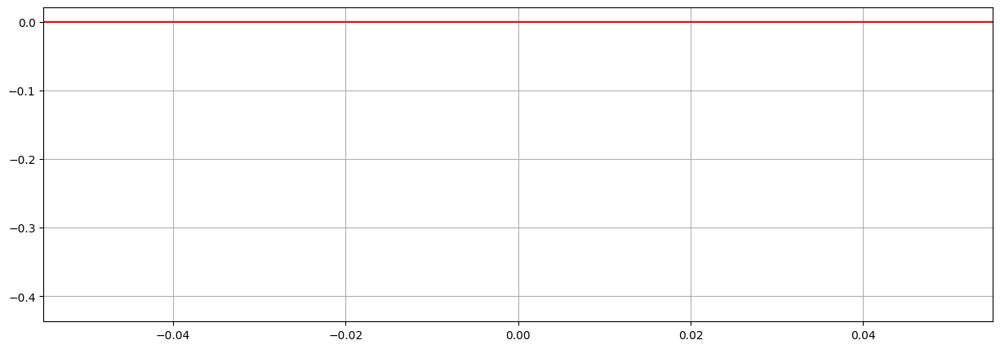

Error processing image Tangan Kiri 6-10\007\007_F_L_31.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\007\007_F_L_32.JPG


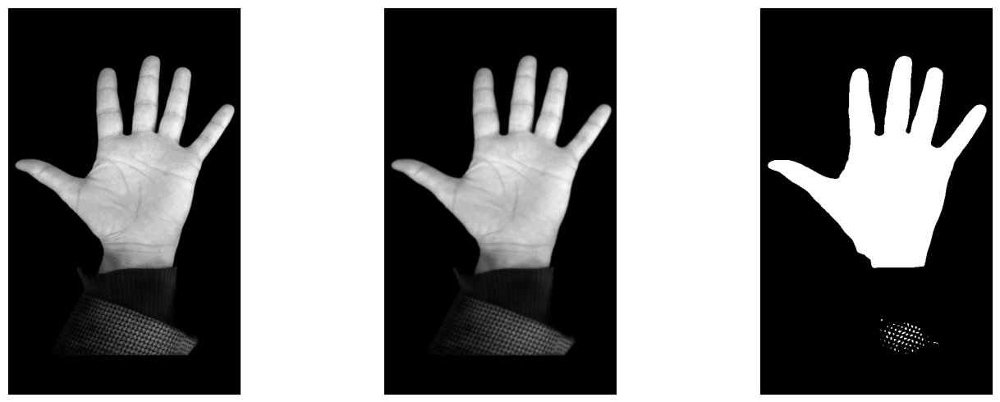

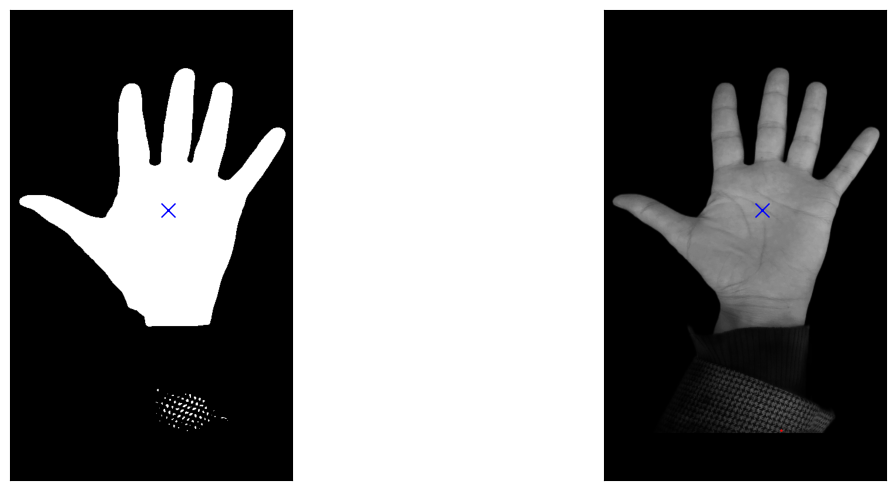

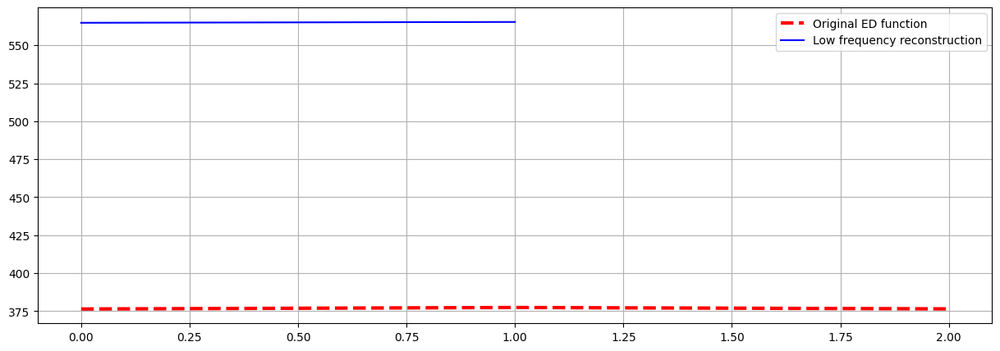

Power Retained: 100.0000%


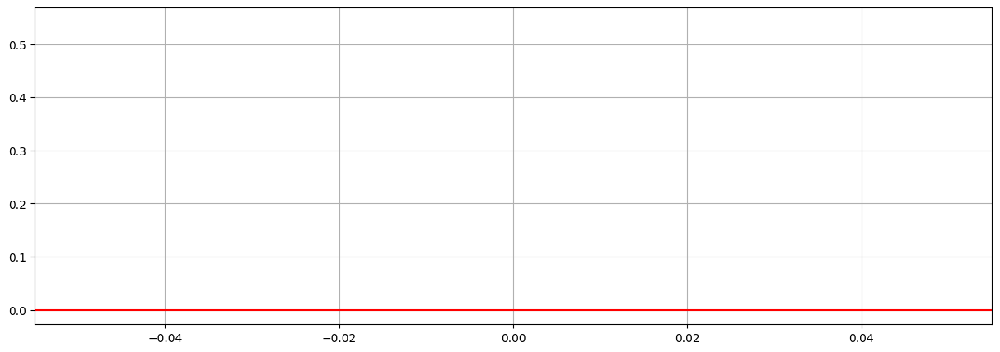

Error processing image Tangan Kiri 6-10\007\007_F_L_32.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\007\007_F_L_33.JPG


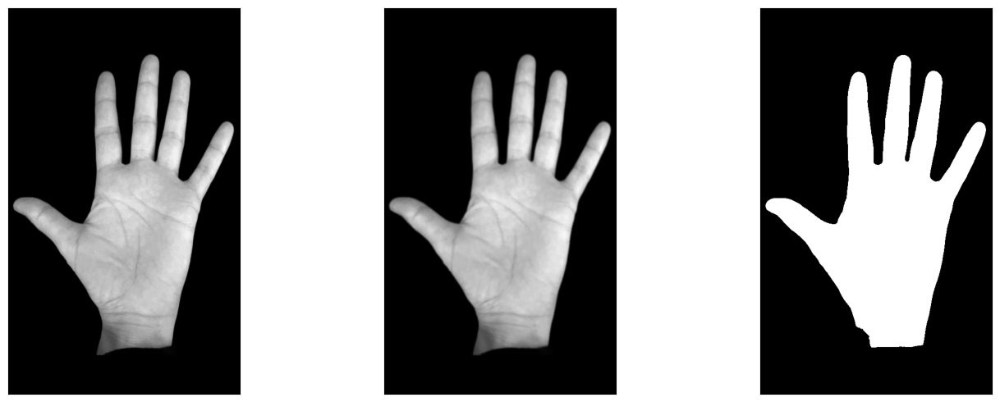

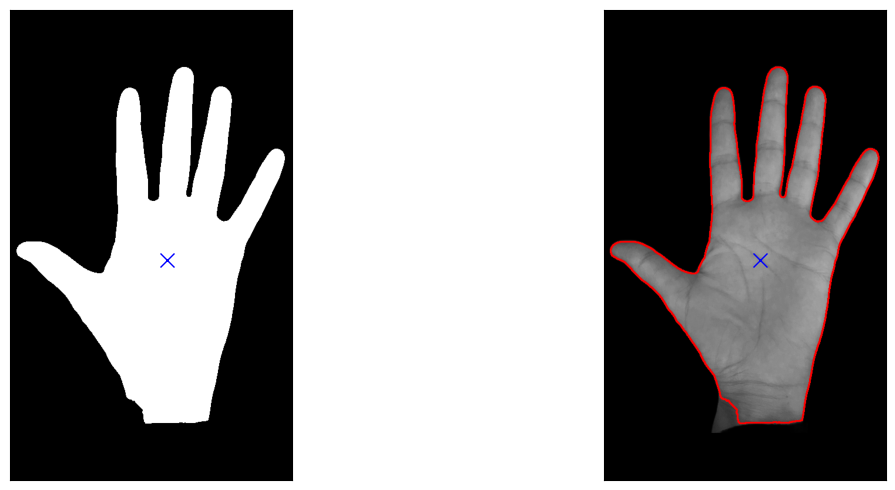

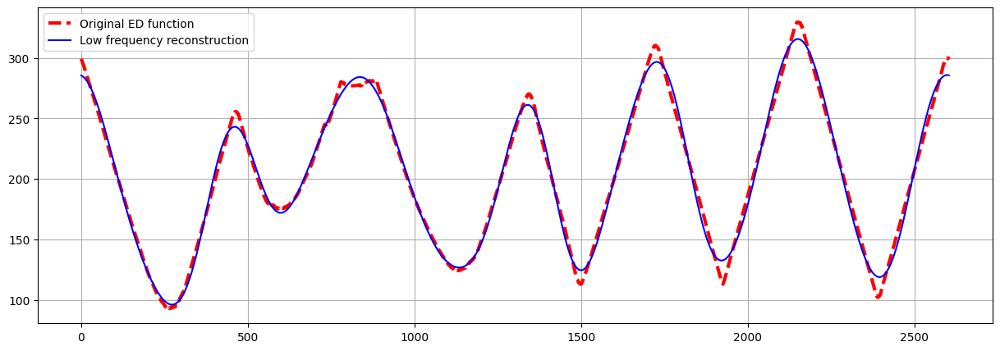

Power Retained: 99.9644%


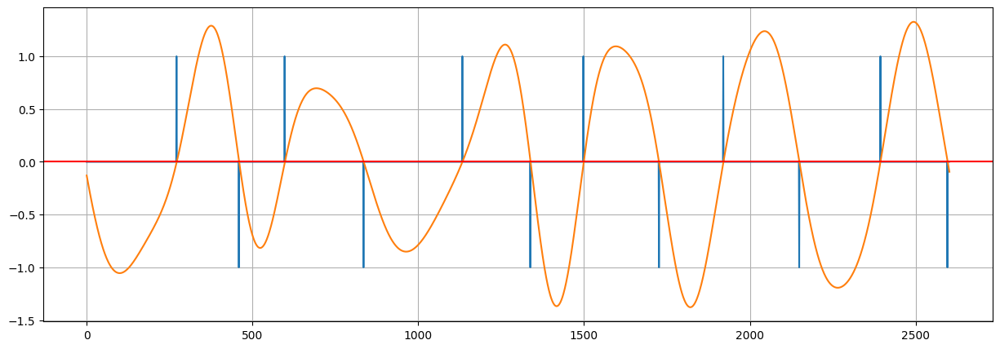

The rotation of ROI is 14.16°


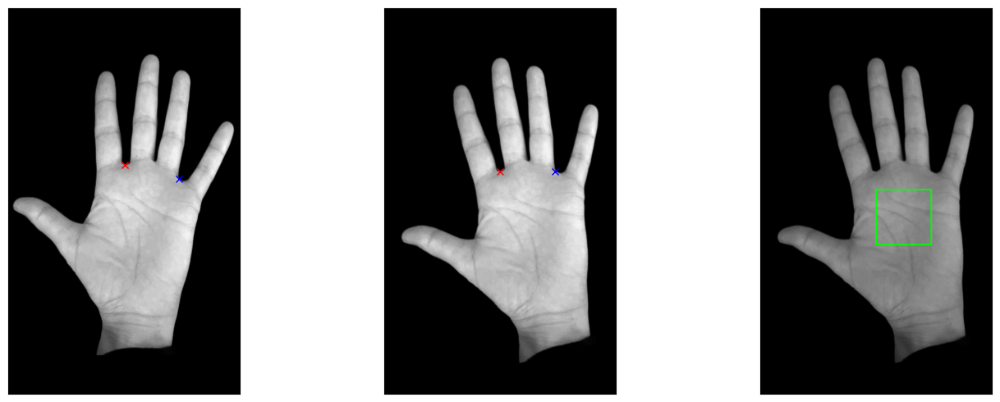

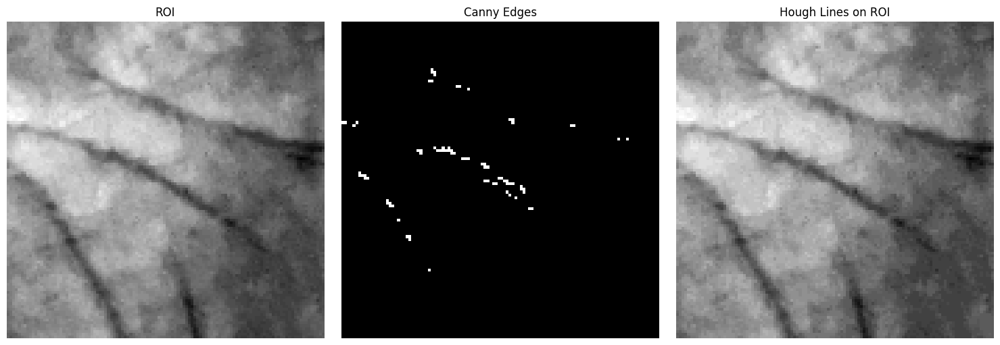

Number of lines detected: 0
Number of edges detected by Canny: 77
Processing image: Tangan Kiri 6-10\007\007_F_L_34.JPG


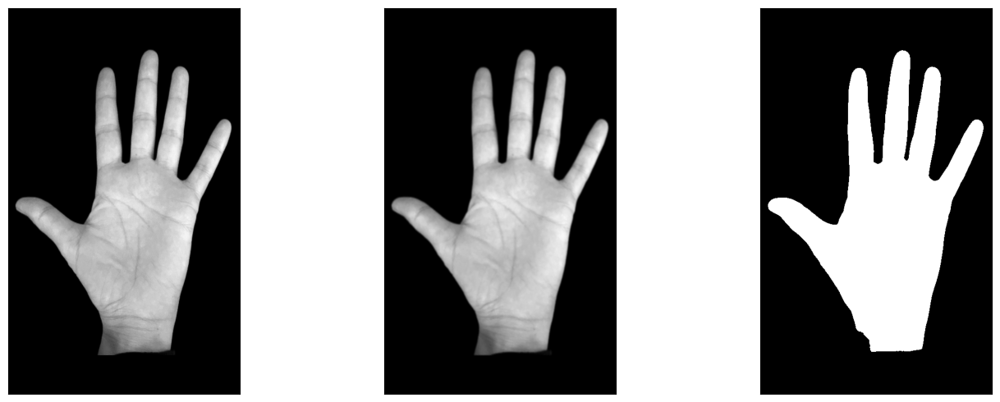

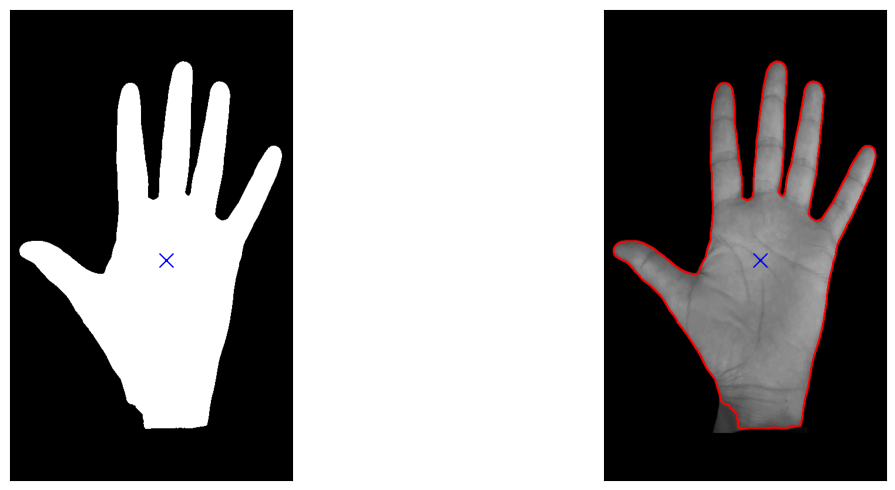

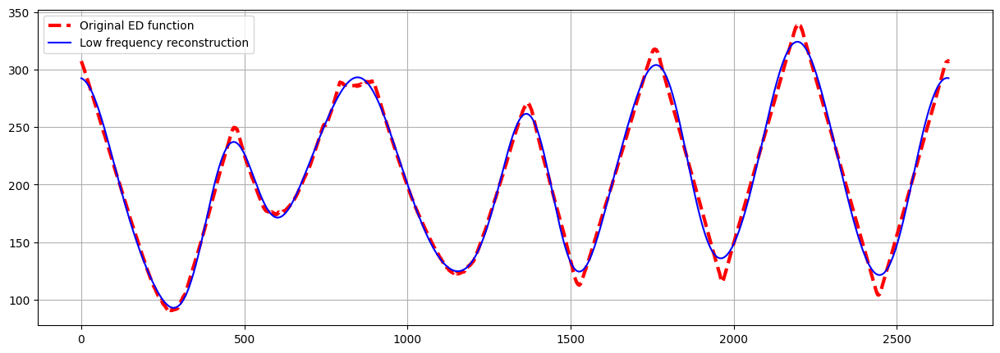

Power Retained: 99.9641%


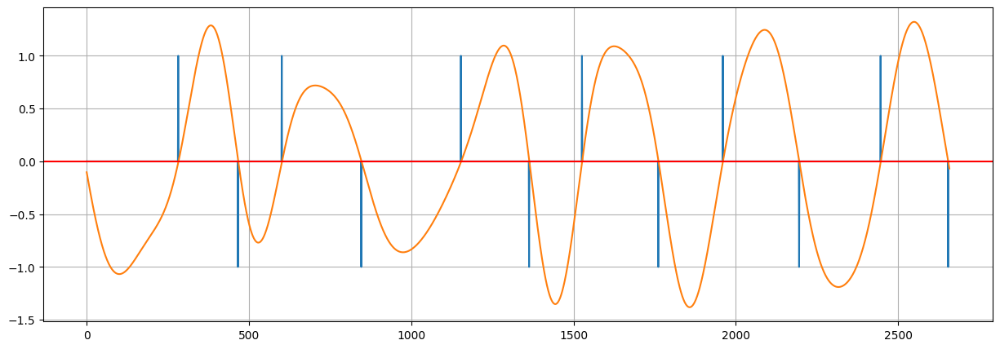

The rotation of ROI is 15.03°


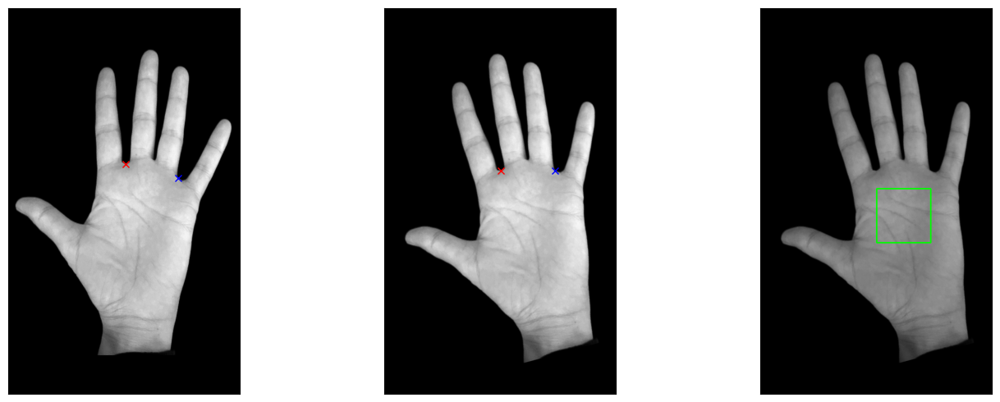

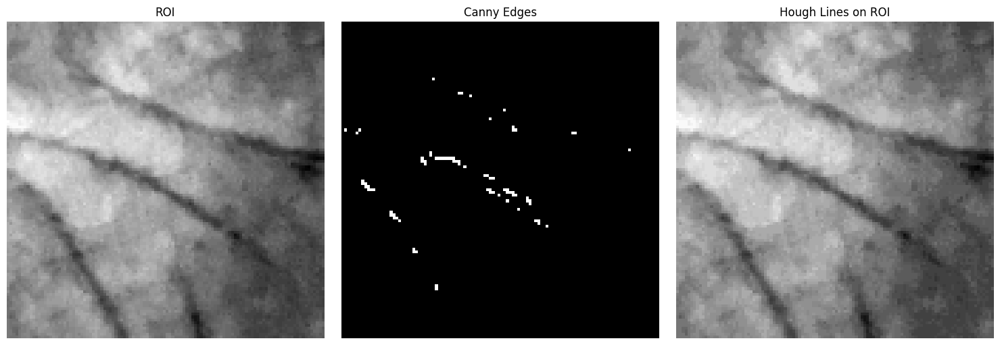

Number of lines detected: 0
Number of edges detected by Canny: 78
Processing image: Tangan Kiri 6-10\007\007_F_L_35.JPG


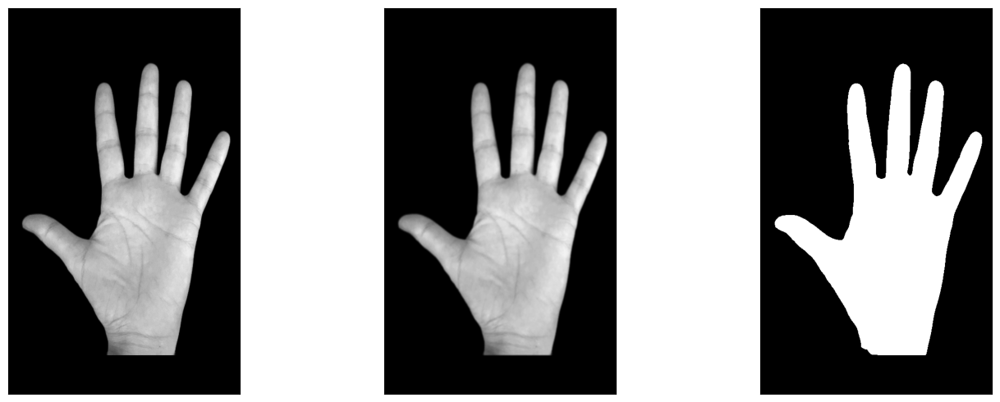

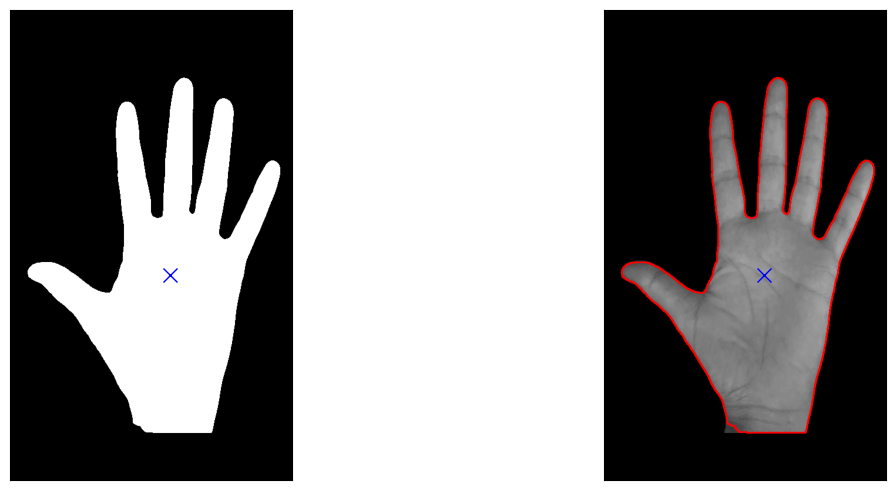

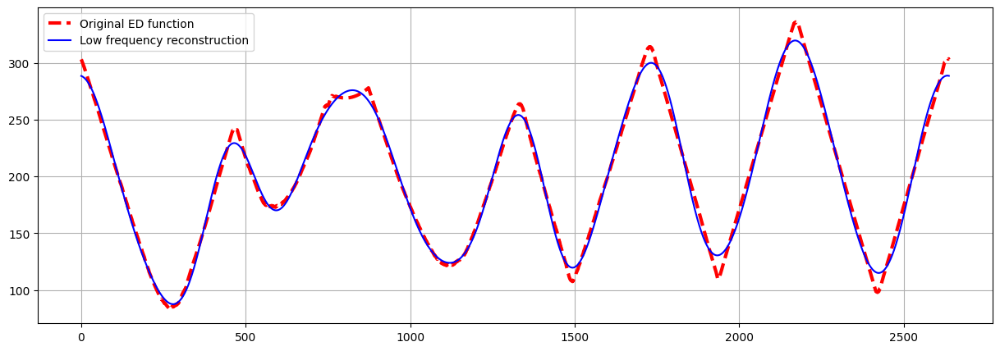

Power Retained: 99.9599%


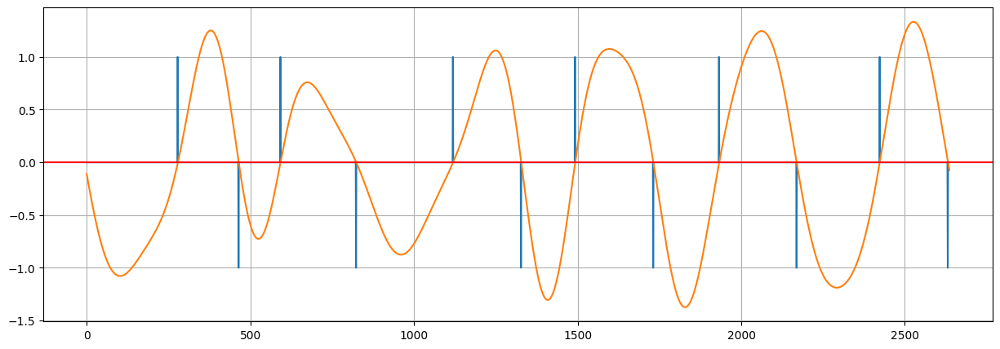

The rotation of ROI is 15.66°


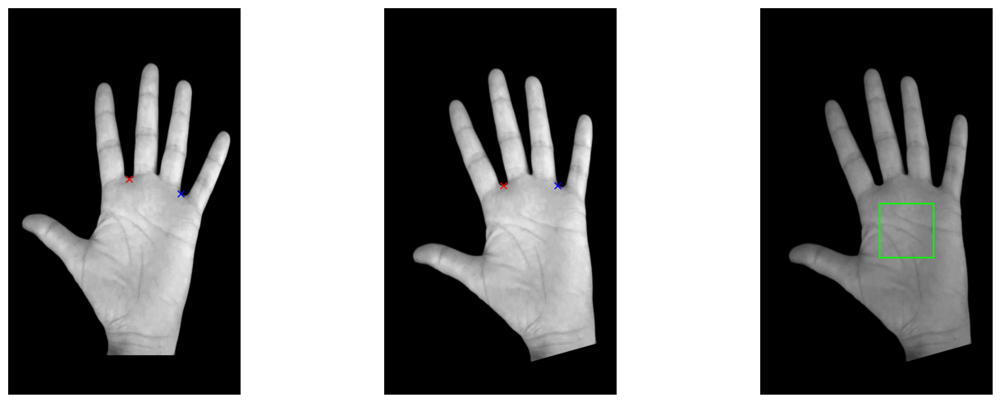

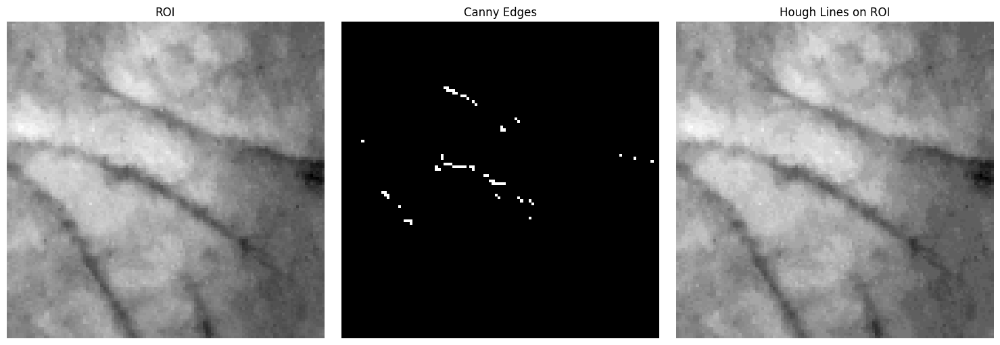

Number of lines detected: 0
Number of edges detected by Canny: 63
Processing image: Tangan Kiri 6-10\007\007_F_L_36.JPG


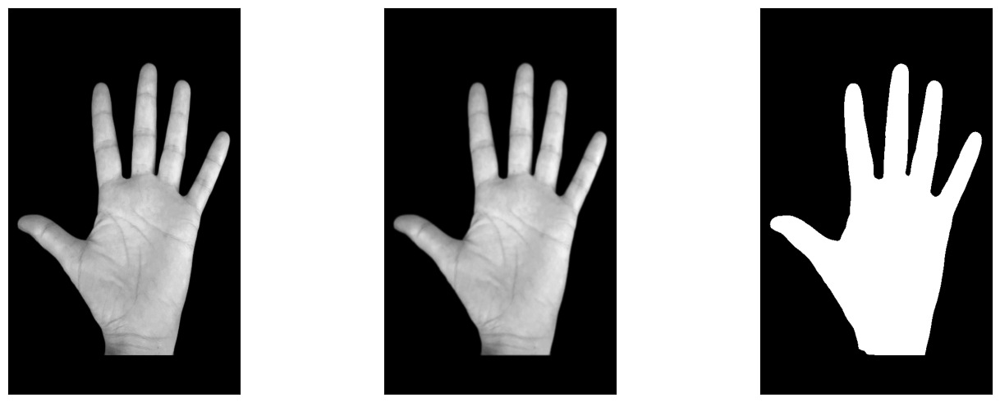

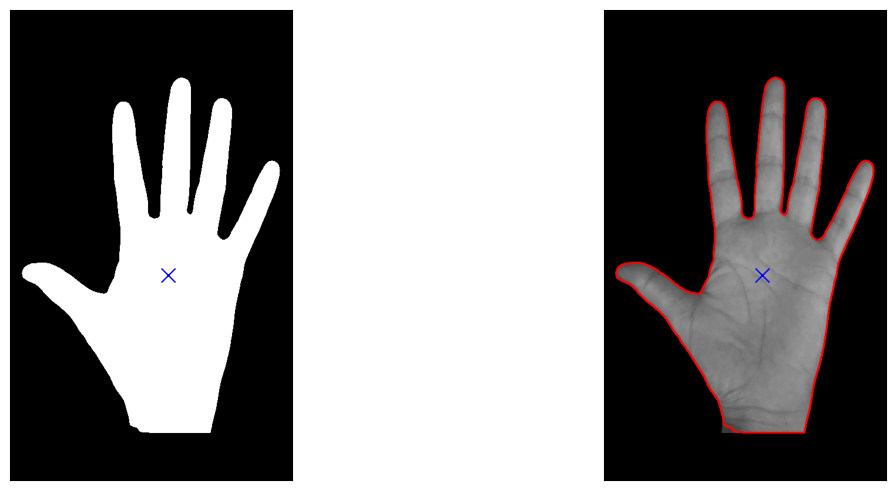

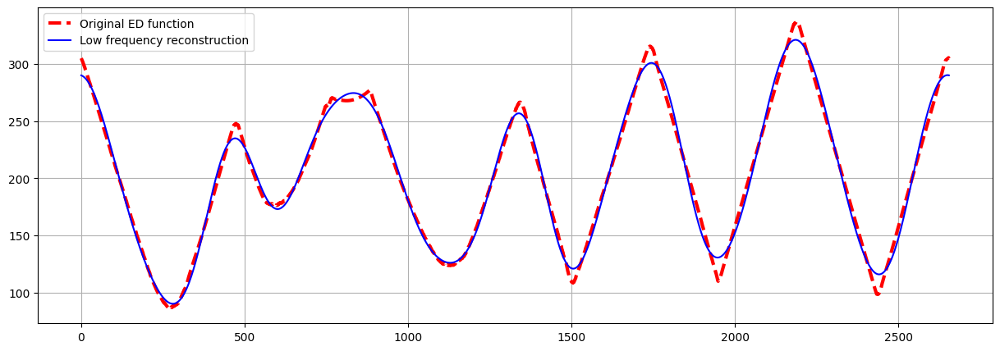

Power Retained: 99.9599%


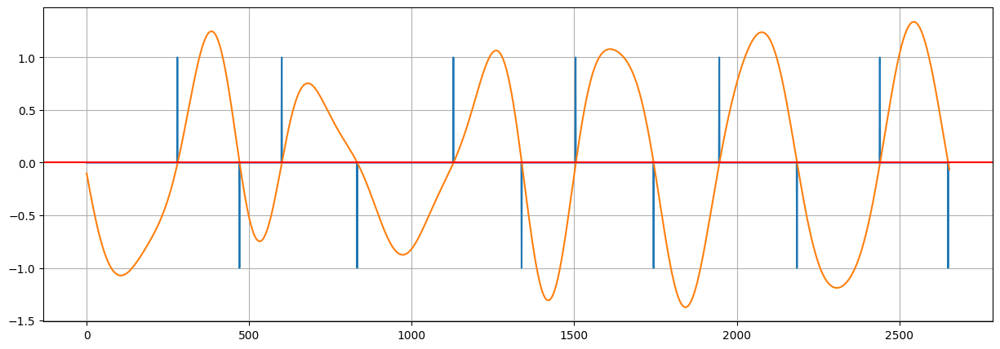

The rotation of ROI is 15.39°


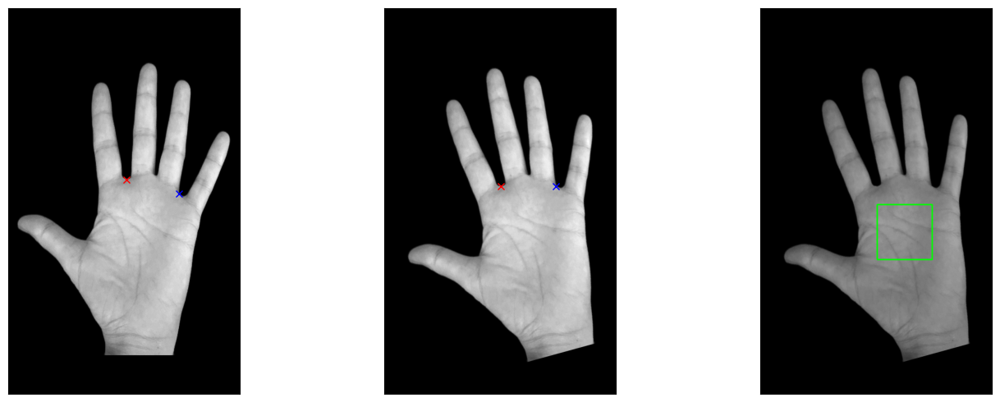

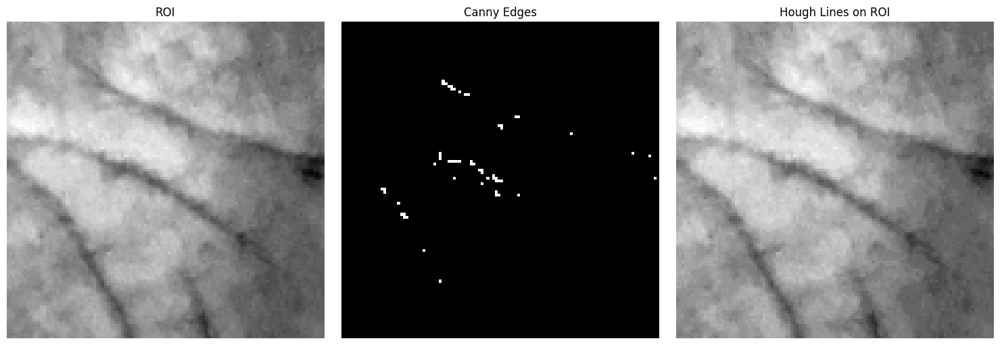

Number of lines detected: 0
Number of edges detected by Canny: 57
Processing image: Tangan Kiri 6-10\007\007_F_L_37.JPG


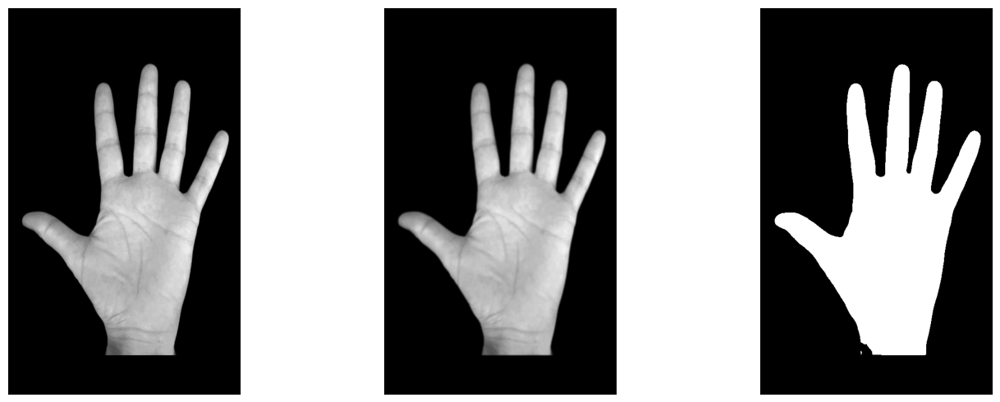

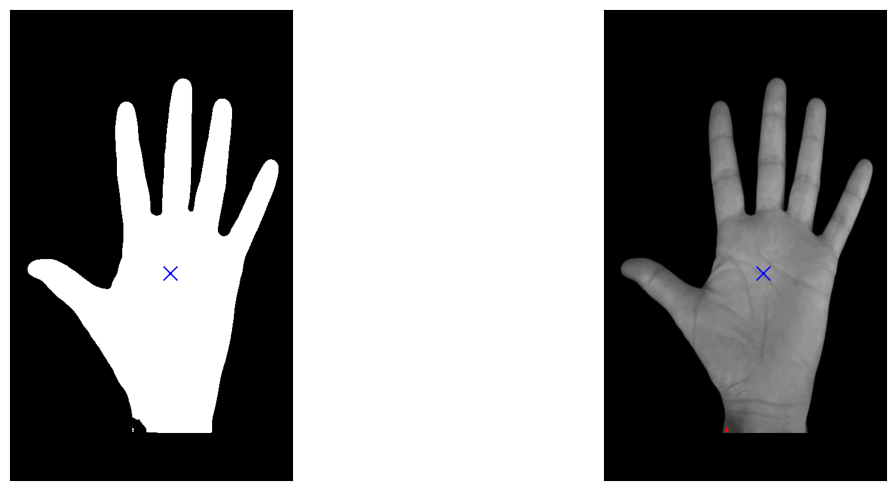

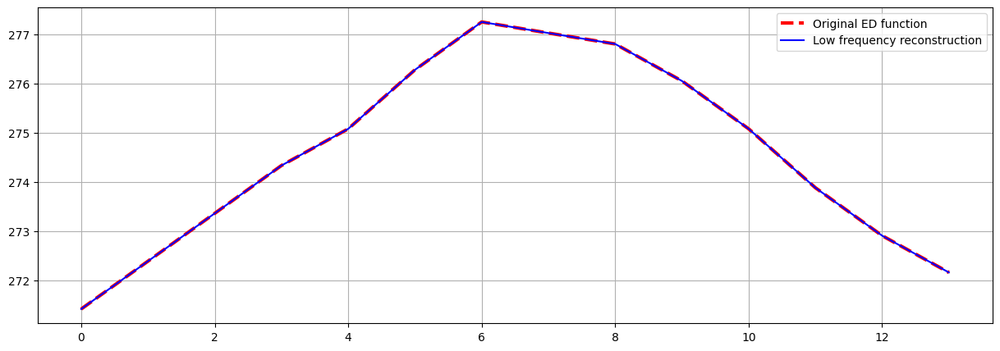

Power Retained: 100.0000%


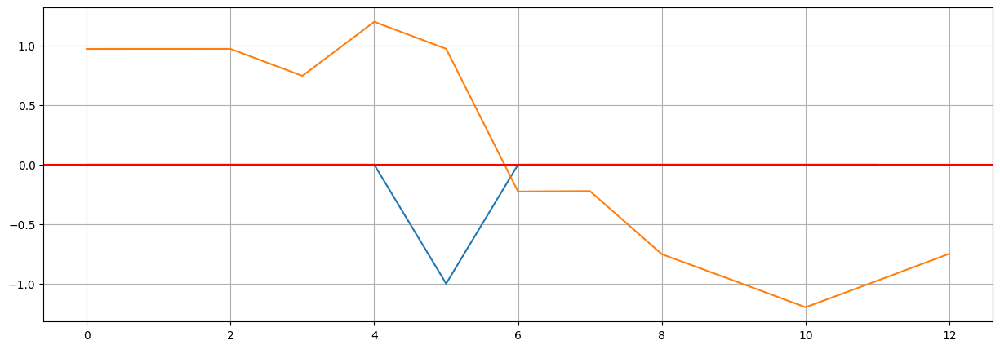

Error processing image Tangan Kiri 6-10\007\007_F_L_37.JPG: index -1 is out of bounds for axis 0 with size 0
Processing image: Tangan Kiri 6-10\007\007_F_L_38.JPG


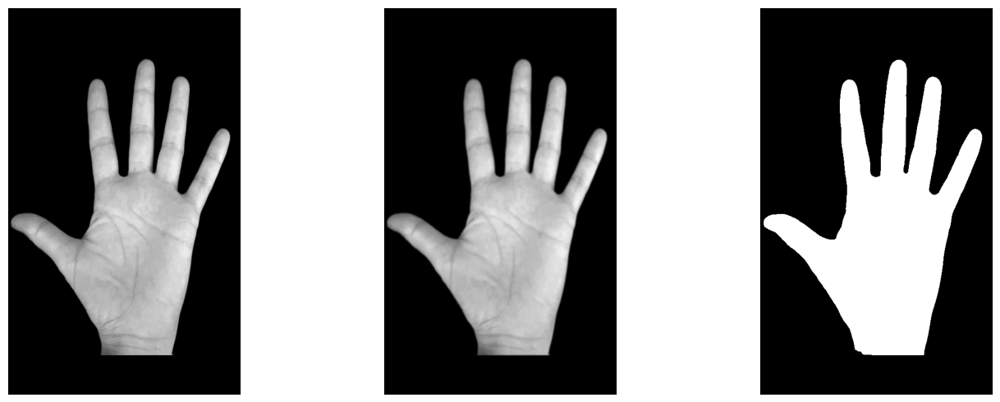

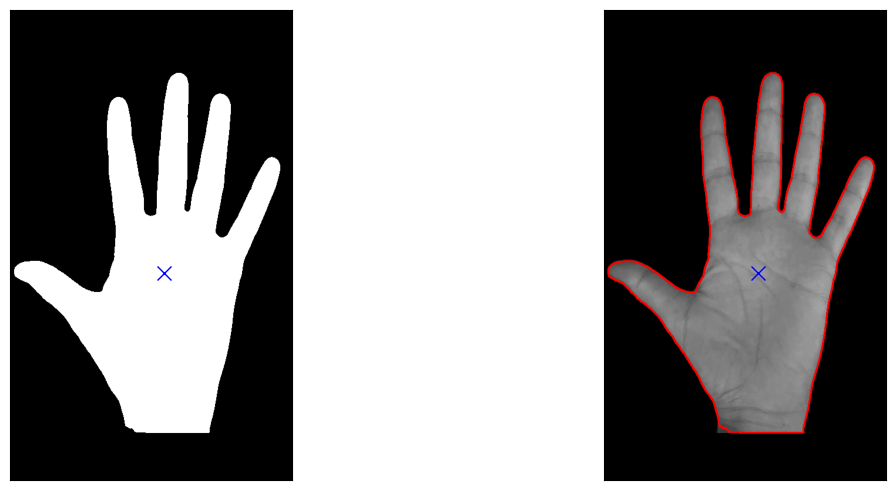

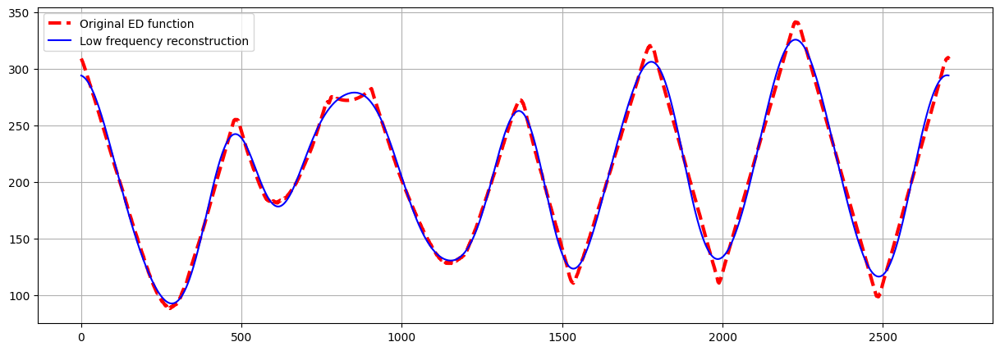

Power Retained: 99.9597%


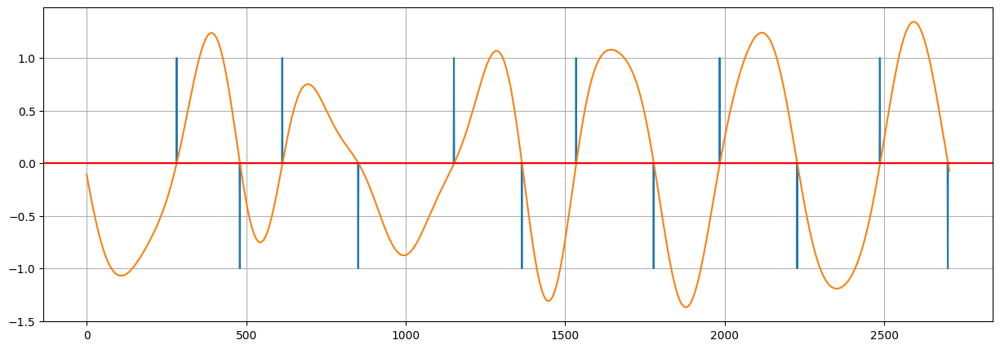

The rotation of ROI is 15.60°


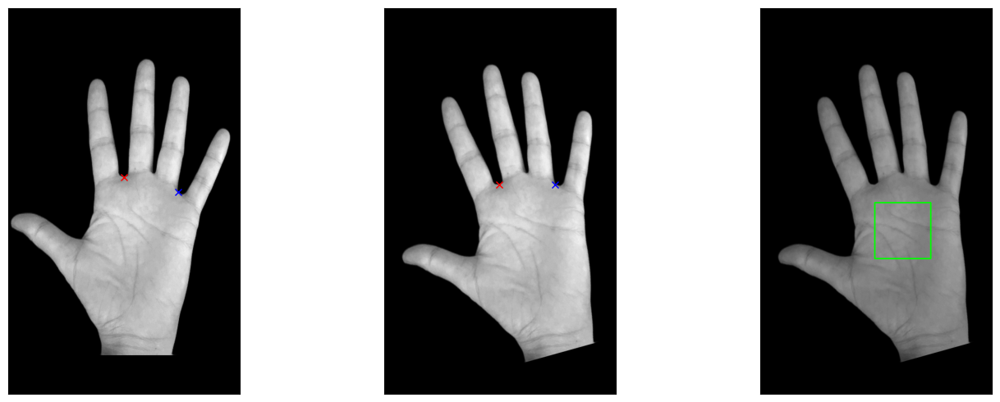

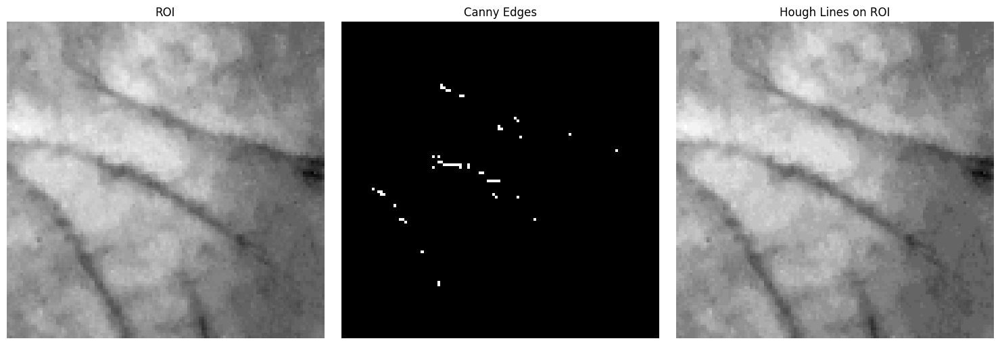

Number of lines detected: 0
Number of edges detected by Canny: 53
Processing image: Tangan Kiri 6-10\007\007_F_L_39.JPG


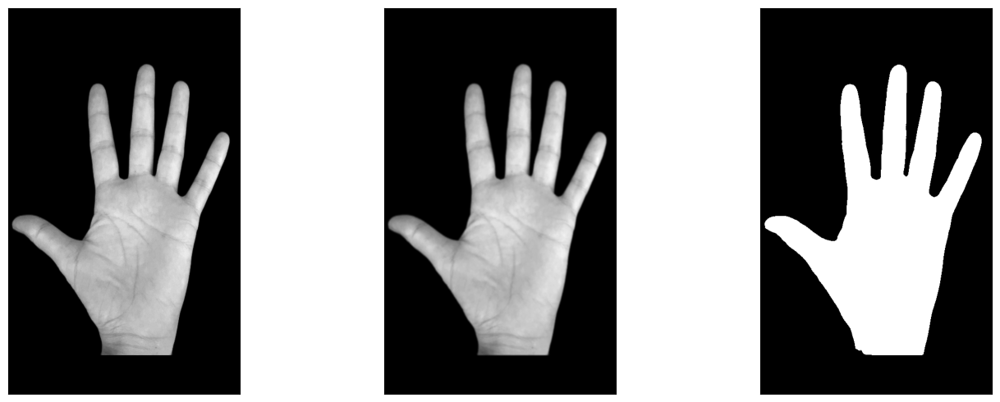

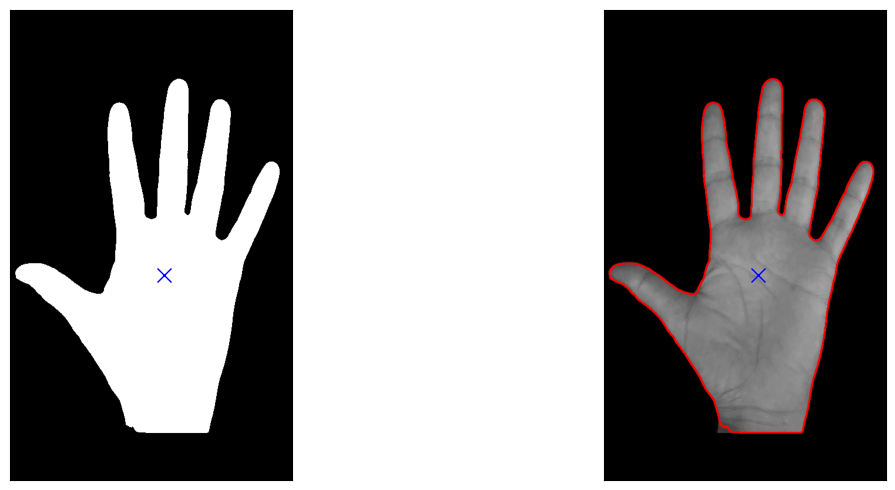

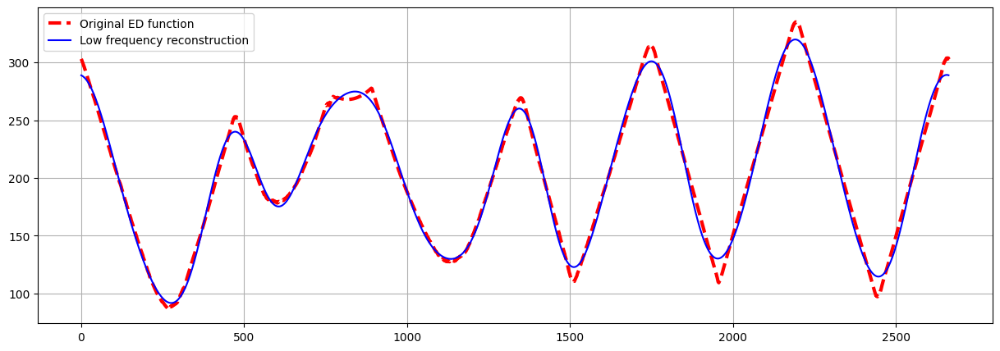

Power Retained: 99.9604%


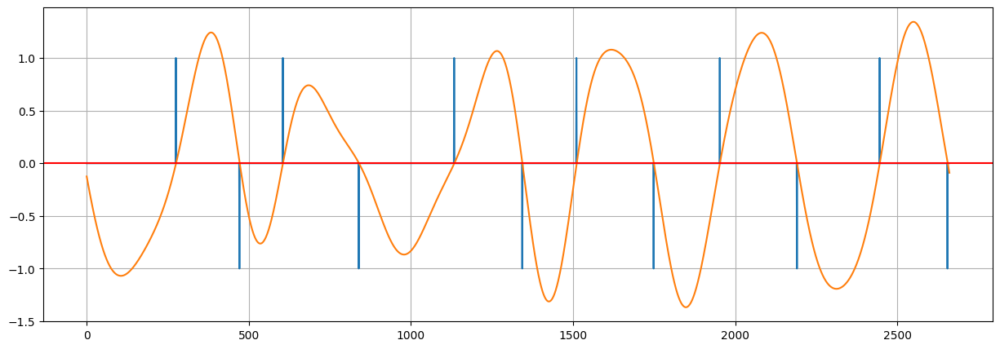

The rotation of ROI is 15.12°


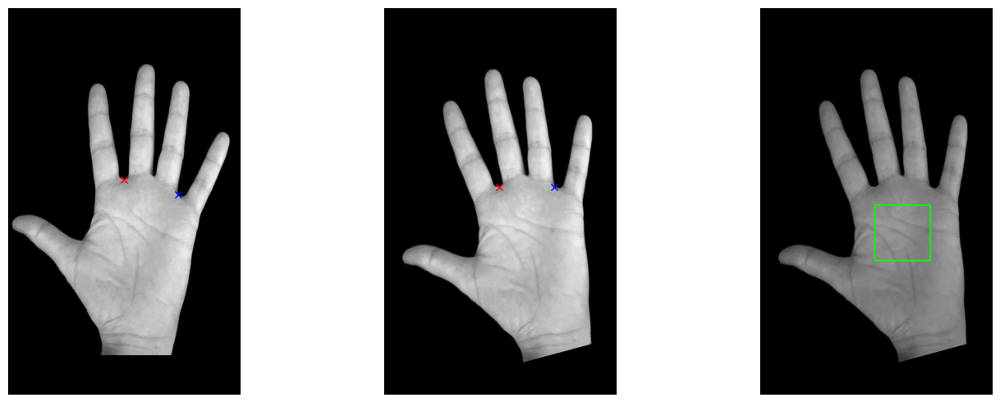

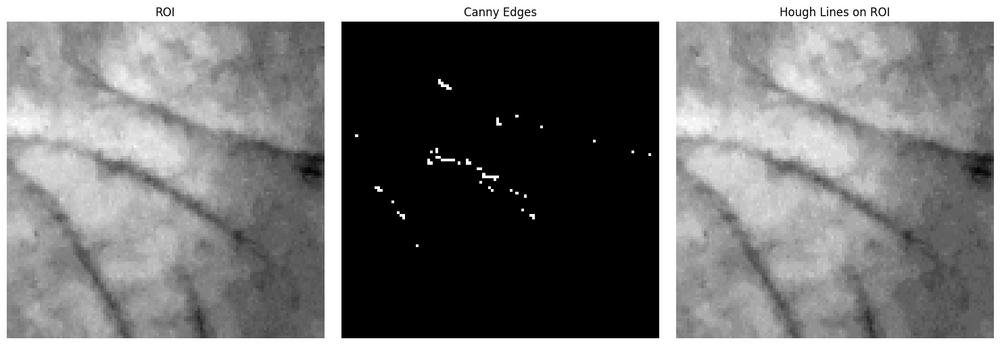

Number of lines detected: 0
Number of edges detected by Canny: 65
Processing image: Tangan Kiri 6-10\007\007_S_L_20.JPG


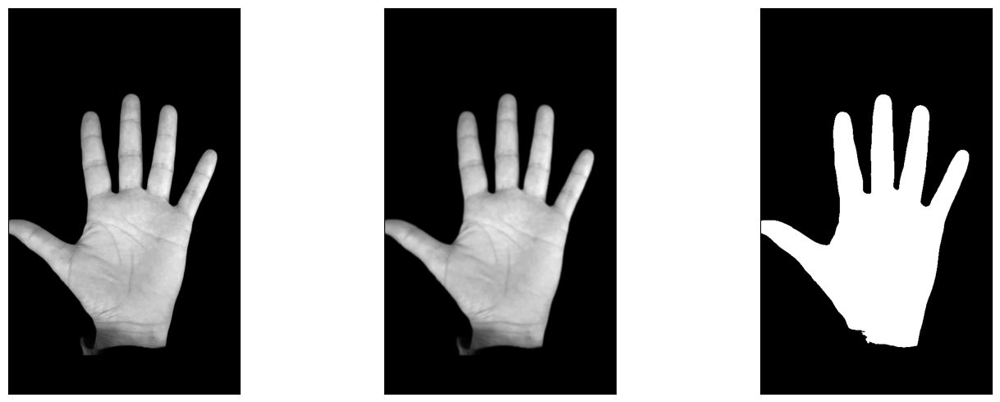

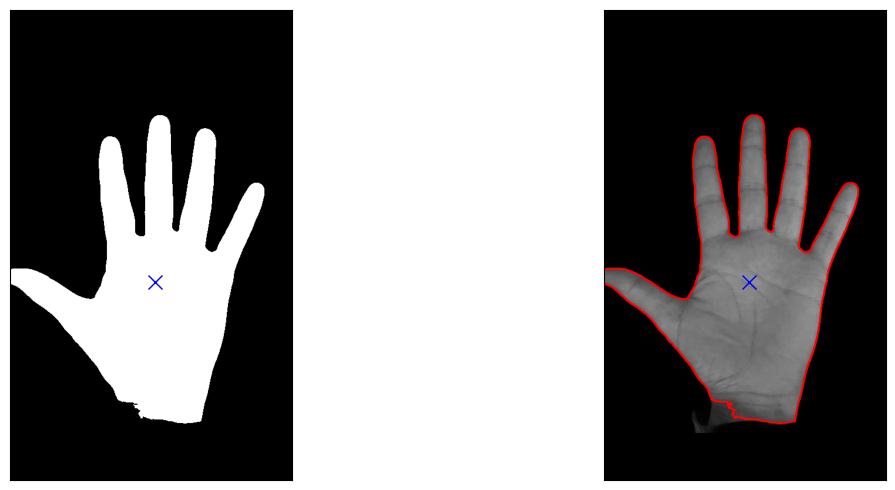

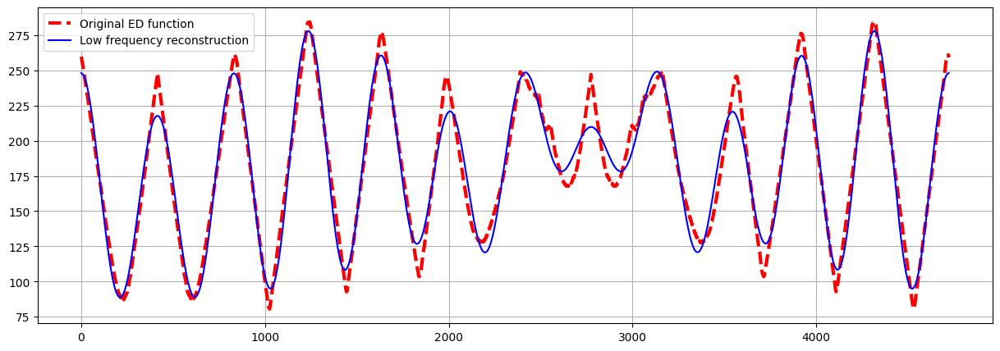

Power Retained: 99.8631%


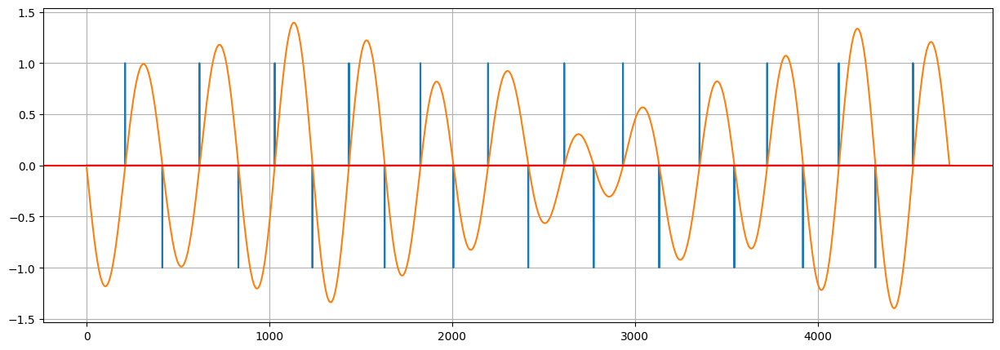

The rotation of ROI is 9.46°


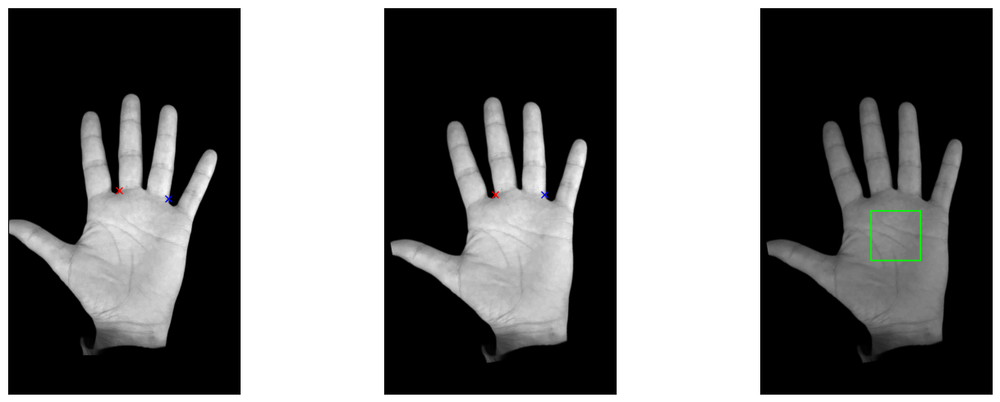

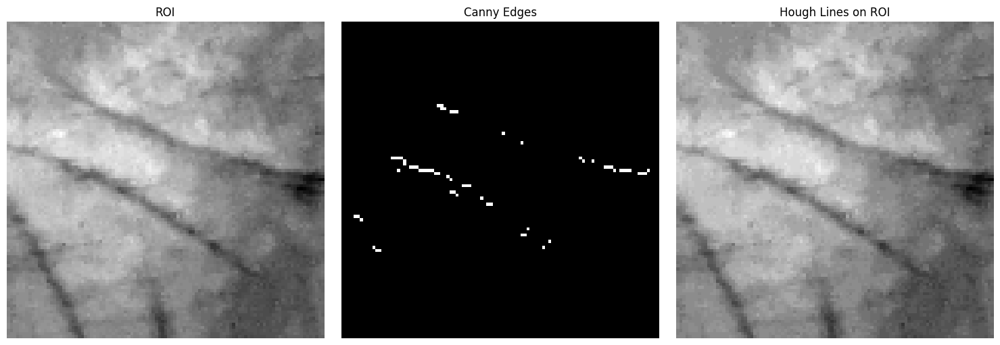

Number of lines detected: 0
Number of edges detected by Canny: 63
Processing image: Tangan Kiri 6-10\007\007_S_L_21.JPG


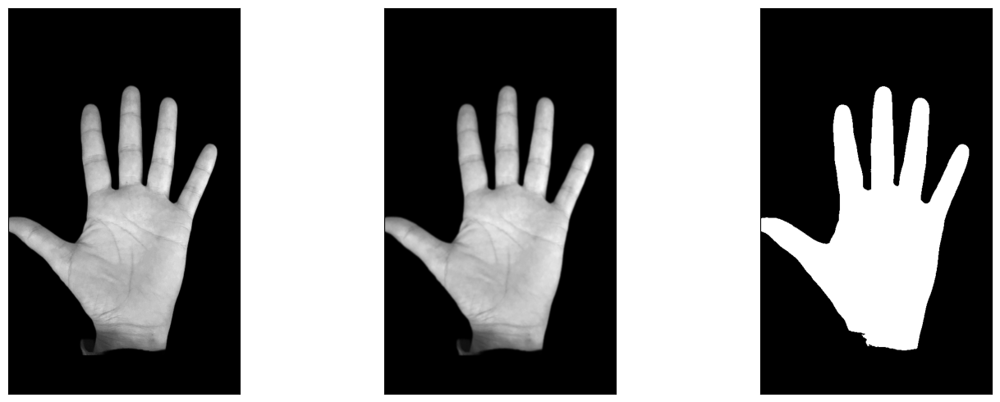

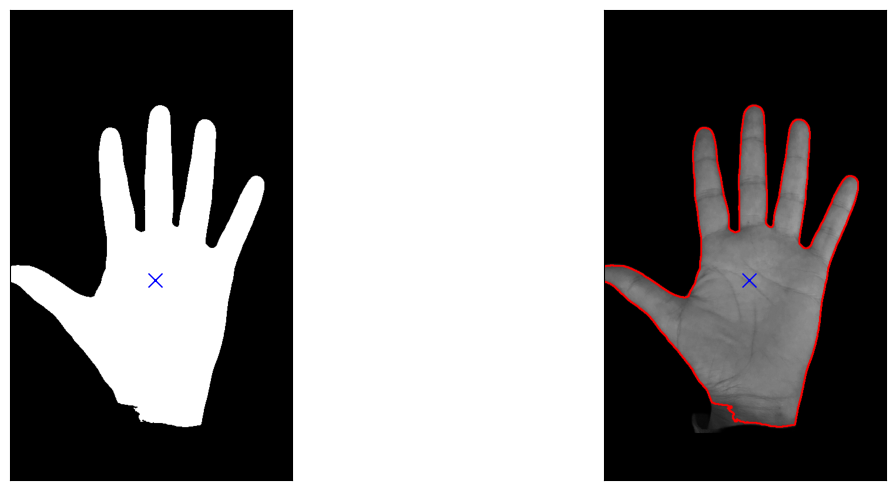

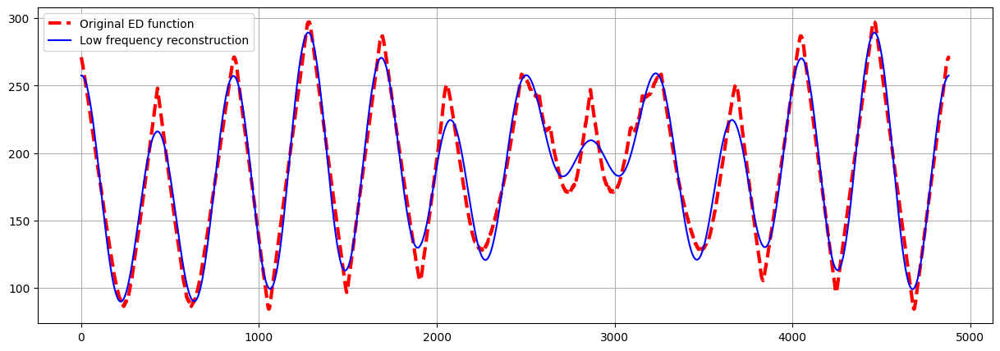

Power Retained: 99.8594%


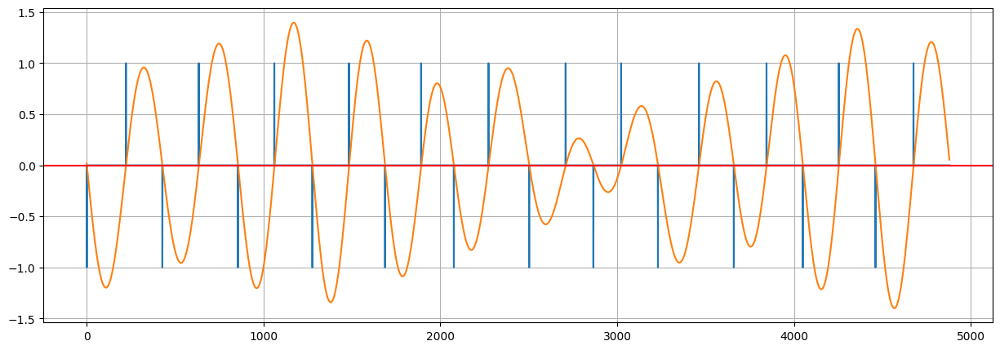

The rotation of ROI is 9.46°


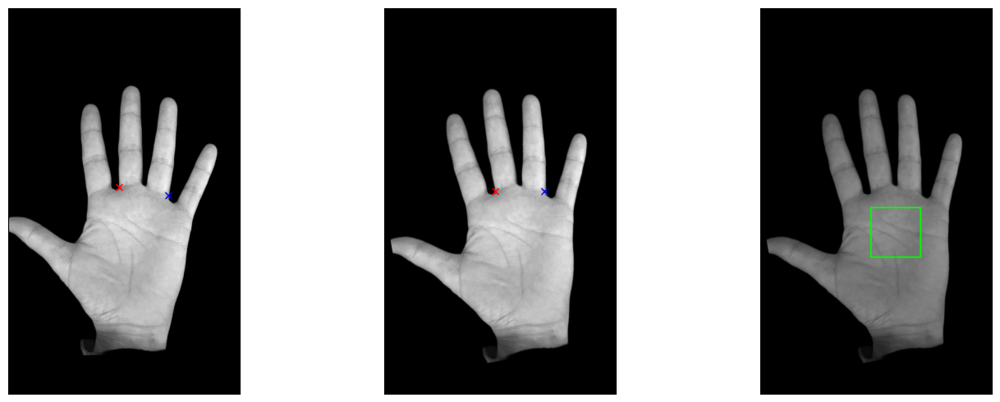

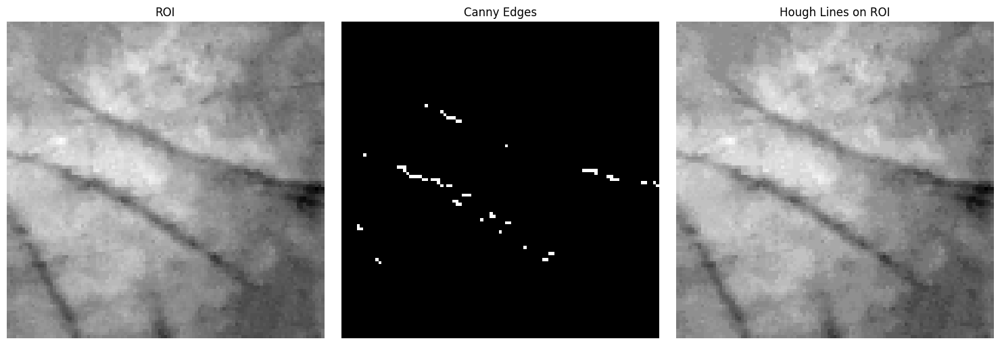

Number of lines detected: 0
Number of edges detected by Canny: 67
Processing image: Tangan Kiri 6-10\007\007_S_L_22.JPG


In [1]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_6-10.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 6-10'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_11-15.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 11-15'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_16-20.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 16-20'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_21-25.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 21-25'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_26-30.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 26-30'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_31-35.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 31-35'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)


In [ ]:
import os
import csv
import numpy as np
import cv2
from PIL import Image
from matplotlib import pyplot as plt
from rembg import remove

def show(img):
    plt.imshow(img, cmap='gray')
    plt.xticks([])
    plt.yticks([])

def process_images_in_folder(parent_folder_path):
    # Create or open a CSV file for writing
    with open('Tangan-Kiri-Canny_36-41.csv', mode='w', newline='') as file:
        fieldnames = ['Image Path', 'Label', 'Number of Lines Detected', 'Number of Edges Detected by Canny']
        writer = csv.DictWriter(file, fieldnames=fieldnames)

        # Write the header to the CSV file
        writer.writeheader()

        # Iterate through all folders inside the parent folder
        for folder_name in os.listdir(parent_folder_path):
            folder_path = os.path.join(parent_folder_path, folder_name)
            if os.path.isdir(folder_path):
                print(f"Processing images in folder: {folder_path}")

                # Loop through all files in the folder
                for filename in os.listdir(folder_path):
                    if filename.endswith(".JPG") or filename.endswith(".jpg"):
                        image_path = os.path.join(folder_path, filename)
                        print(f"Processing image: {image_path}")
                        # Extract label from the folder name
                        label = folder_name
                        process_image(image_path, label, writer)

def process_image(image_path, label, writer):
    try:
        # Membaca gambar
        img = cv2.imread(image_path)

        # Periksa apakah gambar berhasil dimuat
        if img is None:
            raise ValueError(f"Gambar tidak dapat dimuat. Pastikan path benar: {image_path}")

        # Mendapatkan lebar dan tinggi gambar
        h, w = img.shape[:2]

        # Mengubah ukuran gambar
        img_resized = cv2.resize(img, dsize=(480, 640), interpolation=cv2.INTER_CUBIC)

        # Mengubah gambar ke grayscale
        img_resized = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)

        # Open the input image
        input_image = Image.fromarray(img_resized)

        # Remove the background
        output_image = remove(input_image)

        # Convert the RGBA image (4 channels) to RGB (3 channels) to remove the alpha channel
        if output_image.mode == 'RGBA':
            output_image = output_image.convert("RGB")

        # Convert the PIL image to an OpenCV image
        img_original = np.array(output_image)

        # If the image is not grayscale, convert it to grayscale
        if len(img_original.shape) == 3:
            img_original = cv2.cvtColor(img_original, cv2.COLOR_RGB2GRAY)

        # Extend the height of the image by 160 pixels (80 on top and 80 on bottom)
        h, w = img_original.shape
        img = np.zeros((h+160, w), np.uint8)
        img[80:-80, :] = img_original

        # Apply Gaussian Blur
        blur = cv2.GaussianBlur(img, (5,5), 0)

        # Apply Otsu's thresholding
        _, th = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # Display the original, blurred, and thresholded images
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.subplot(132)
        show(blur)
        plt.subplot(133)
        show(th)
        plt.tight_layout()
        plt.show()

        M = cv2.moments(th)
        h, w = img.shape
        x_c = M['m10'] // M['m00']
        y_c = M['m01'] // M['m00']
        plt.figure(figsize=(15,5))
        plt.subplot(121)
        show(th)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        kernel = np.array([[0, 1, 0],
                           [1, 1, 1],
                           [0, 1, 0]]).astype(np.uint8)
        erosion = cv2.erode(th,kernel,iterations=1)
        boundary = th - erosion

        cnt, _ = cv2.findContours(boundary, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
        img_c = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cnt = cnt[0]
        img_cnt = cv2.drawContours(img_c, [cnt], 0, (255,0,0), 2)
        plt.subplot(122)
        plt.plot(x_c, y_c, 'bx', markersize=10)
        show(img_cnt)
        plt.tight_layout()
        plt.show()

        cnt = cnt.reshape(-1,2)
        left_id = np.argmin(cnt.sum(-1))
        cnt = np.concatenate([cnt[left_id:,:], cnt[:left_id,:]])

        dist_c = np.sqrt(np.square(cnt-[x_c, y_c]).sum(-1))
        f = np.fft.rfft(dist_c)
        cutoff = 15
        f_new = np.concatenate([f[:cutoff],0*f[cutoff:]])
        dist_c_1 = np.fft.irfft(f_new)
        plt.figure(figsize=(15,5))
        plt.grid()
        plt.plot(dist_c, label='Original ED function', color='r', linewidth='3', linestyle='--')
        plt.plot(dist_c_1, label='Low frequency reconstruction', color='b', linestyle='-')
        plt.legend()
        plt.show()

        eta = np.square(np.abs(f_new)).sum()/np.square(np.abs(f)).sum()
        print('Power Retained: {:.4f}{}'.format(eta*100,'%'))

        derivative = np.diff(dist_c_1)
        sign_change = np.diff(np.sign(derivative))/2
        plt.figure(figsize=(15,5))
        plt.plot(sign_change)
        plt.plot(derivative)
        plt.axhline(y=0, color='r')
        plt.grid()
        plt.show()

        minimas = cnt[np.where(sign_change > 0)[0]]
        v1, v2 = minimas[-1], minimas[-3]
        plt.figure(figsize=(15,5))
        plt.subplot(131)
        show(img)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')

        plt.subplot(132)
        theta = np.arctan2((v2 - v1)[1], (v2 - v1)[0]) * 180/np.pi
        print('The rotation of ROI is {:.02f}\u00b0'.format(theta))
        center = (int((v1[0] + v2[0]) // 2), int((v1[1] + v2[1]) // 2))
        R = cv2.getRotationMatrix2D(tuple(center), theta, 1)
        img_r = cv2.warpAffine(img, R, (w, h))
        v1 = (R[:,:2] @ v1 + R[:,-1]).astype(int)
        v2 = (R[:,:2] @ v2 + R[:,-1]).astype(int)
        plt.plot(v1[0], v1[1],'rx')
        plt.plot(v2[0], v2[1],'bx')
        show(img_r)

        ux = v1[0]
        uy = v1[1] + (v2 - v1)[0] // 3
        lx = v2[0] 
        ly = v2[1] + 4 * (v2 - v1)[0] // 3
        img_c = cv2.cvtColor(img_r, cv2.COLOR_GRAY2BGR)
        cv2.rectangle(img_c, (lx, ly), (ux, uy), (0, 255, 0), 2)
        plt.subplot(133)
        show(img_c)

        plt.tight_layout()
        plt.show()

        roi = img_r[uy:ly, ux:lx]

        # Assuming 'roi' is the region of interest of your image

        # Given the provided Canny edge detection and Hough line transform parameters, let's apply them and count the number of lines detected.

        # Adjusting the Canny edge detection thresholds as provided
        canny_edges = cv2.Canny(roi, 60, 60)

        # Performing Hough Line Transform with the provided parameters
        lines = cv2.HoughLinesP(canny_edges, 1, np.pi/180, threshold=20, minLineLength=5, maxLineGap=10)

        # Create an image to draw the lines on the ROI
        hough_lines_image = np.zeros_like(roi)

        # Initialize a counter for the number of lines
        number_of_lines = 0
        # Count the number of edges detected by Canny
        num_canny_edges = np.sum(canny_edges > 0)

        # Initialize lists to store line lengths and coordinates
        line_lengths = []
        line_coordinates = []

        # Draw the lines on the image and calculate line lengths and coordinates
        if lines is not None:  # If lines were detected
            number_of_lines = len(lines)
            for line in lines:
                x1, y1, x2, y2 = line[0]
                cv2.line(hough_lines_image, (x1, y1), (x2, y2), (255, 0, 0), 1)
                # Calculate length of the line
                length = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
                line_lengths.append(length)
                # Store coordinates of line endpoints
                line_coordinates.append([(x1, y1), (x2, y2)])

        # Overlay detected lines on the original ROI
        hough_lines_with_roi = cv2.addWeighted(roi, 0.8, hough_lines_image, 1, 0)

        # Display the results
        plt.figure(figsize=(15, 5))

        plt.subplot(131)
        plt.imshow(roi, cmap='gray')
        plt.title('ROI')
        plt.axis('off')

        plt.subplot(132)
        plt.imshow(canny_edges, cmap='gray')
        plt.title('Canny Edges')
        plt.axis('off')

        plt.subplot(133)
        plt.imshow(hough_lines_with_roi, cmap='gray')
        plt.title('Hough Lines on ROI')
        plt.axis('off')

        plt.tight_layout()
        plt.show()
        print(f'Number of lines detected: {number_of_lines}')
        print(f'Number of edges detected by Canny: {num_canny_edges}')

        # Write the data to CSV
        writer.writerow({'Image Path': image_path, 'Label': label, 'Number of Lines Detected': number_of_lines, 'Number of Edges Detected by Canny': num_canny_edges})

    except Exception as e:
        print(f"Error processing image {image_path}: {e}")

# Path folder yang berisi gambar-gambar
folder_path = 'Tangan Kiri 36-41'  # Ganti dengan path folder yang sesuai

# Proses semua gambar di folder tersebut
process_images_in_folder(folder_path)
